In [1]:
import seaborn as sns  
import matplotlib.pyplot as plt  
import pandas as pd 
from tqdm import tqdm  
import os 
import statsmodels.api as sm  
import numpy as np
from scipy import stats

In [2]:
gut=[
'麦胶蛋白抗体'
,'组织转麸胺酶抗体'
,'分泌型免疫球蛋白'
,'钙卫蛋白'
,'解连蛋白'
,'葡萄糖醛酸酶'
,'胰弹性蛋白酶']

gut_english = ['Anti-Gliadin slgA', 'Anti-htTG slgA', 
       'slgA', 'Calprotectin', 'Zonulin', 
       'Beta-Glucuronidase', 'Pancreatic Elastase']

organic_acid=['尿肌酐-1073'
,'46. 阿拉伯糖醇'
,'45. 酒石酸'
,'44. 柠苹酸'
,'43. 丙三羧酸'
,'42. 二羟基苯丙酸'
,'41. 吲哚乙酸'
,'40. 4-羟基苯乙酸'
,'39. 4-羟基苯甲酸'
,'38. 苯丙酸'
,'37. 苯乙酸'
,'36. 马尿酸'
,'35. 苯甲酸'
,'34. 乳清酸'
,'33. 焦谷氨酸'
,'32. α-羟丁酸'
,'31. 葡萄糖二酸'
,'30. 苯基乙醛酸'
,'29. 杏仁酸'
,'28. 2-甲基马尿酸'
,'1. 己二酸'
,'2. 辛二酸'
,'3. 乙基丙二酸'
,'4. 丙酮酸'
,'5. 乳酸'
,'6. β-羟基丁酸'
,'7. 柠檬酸'
,'8. 顺式乌头酸'
,'9. 异柠檬酸'
,'10. α-酮戊二酸'
,'11. 琥珀酸'
,'12. 富马酸'
,'13. 苹果酸'
,'14. 羟甲基戊二酸'
,'15. α-酮异戊酸'
,'16. α-酮异己酸'
,'17. α-酮-β-甲基戊酸'
,'18. 黄尿酸'
,'19. β-羟基异戊酸'
,'20. 甲基丙二酸'
,'22. 高香草酸'
,'23. 香草基扁桃酸'
,'24. 5-羟吲哚乙酸'
,'25. 犬尿喹啉酸'
,'26. 吡啶甲酸'
,'27. 喹啉酸'
,'21. 亚胺甲基谷氨酸'
]

organic_acid_english = ['Urinary creatinine', 'Arabitol', 'Tartarate', 'Citric acid',
                 'Tricarballylate', 'DHPPA', 'IAA',
                 '4-HPAA', '4-HBA', 'PPA',
                 'PAA', 'Hippurate', 'Benzoate', 'Orotate',
                 'Pyroglutamate', 'AHBA', 'Glucarate',
                 'PGA', 'Mandelate', '2-MetHip',
                 'Adipate', 'Suberate', 'Ethylmalonate',
                 'Pyruvate', 'Lactate', 'BHBA',
                 'Citrate', 'Cis-aconitate', 'Isocitrate',
                 'AKG', 'Succinate', 'Fumarate',
                 'Malate', 'HMG',
                 'AKIV', 'AKIC',
                 'AKBM', 'Xanthurenate',
                 'BHIVA', 'MMA',
                 'HVA', 'VMA',
                 '5-HIAA', 'Kynurenate',
                 'Picolinate', 'Quinolinate',
                 'FIGLU']

cytokine=['干扰素α'
,'肿瘤坏死因子'
,'干扰素γ'
,'白介素12'
,'白介素1β'
,'白介素17'
,'白介素10'
,'白介素8'
,'白介素6'
,'白介素5'
,'白介素4'
,'白介素2'
]

cytokine_english = [
    'IFN-α', 'TNF', 'IFN-γ',
    'IL-12', 'IL-1β', 'IL-17',
    'IL-10', 'IL-8', 'IL-6',
    'IL-5', 'IL-4', 'IL-2'
]

oxidative=[
'8-羟基脱氧鸟苷'
,'丙二醛'
,'谷胱甘肽'
,'含硫化合物'
,'谷胱甘肽硫转移酶'
,'谷胱甘肽过氧化物酶'
,'超氧化物歧化酶'
,'尿肌酐-1131'
,'花生四烯酸过氧化物'
,'硝化酪氨酸']


oxidative_english = [
    '8-OHdG', 
    'MDA', 
    't-GSH', 
    'f-Thiol', 
    'GSTs', 
    'GSHPx', 
    'SOD', 
    'Urine creatinine',  
    'F2-lsoPs', 
    'Nitrotyrosine'  
]

Hormone=[
'三氯沙'
,'双酚A'
,'单甲基酯'
,'单乙基酯'
,'单丁基酯'
,'单苄基酯'
,'单乙基己基酯'
,'甲酯'
,'乙酯'
,'丙酯'
,'丁酯'
,'壬基苯酯'
,'辛基苯酯'
,'丁基苯酯'
,'尿肌酐-1055'
]

Hormone_english = ['Triclosan', 'BPA', 'MMP', 'MEP', 
                   'MBP', 'MBzP', 
            'MEHP', 'MP', 'EP', 'PP', 'BP', 
            'Nonylphenyl Ester', 'OctylPhenyl Ester', 'ButylPhenyl Ester', 'Urinary creatinine']

foodallergy=['牛奶'
,'玉米'
,'虾'
,'鳕鱼'
,'猪肉'
,'羊肉'
,'鸡肉'
,'牛肉'
,'蛋黄'
,'蛋白'
,'羊奶'
,'芒果'
,'香蕉'
,'苹果'
,'番茄'
,'土豆'
,'韭菜'
,'芹菜'
,'花生'
,'大豆/毛豆'
,'小麦'
,'鳗鱼'
,'鱿鱼'
,'蛤'
,'蟹'
,'鲍鱼'
,'鸭肉'
,'酸奶'
,'巧达芝士'
,'菠萝'
,'薏仁'
,'燕麦'
,'米'
,'麸质'
,'荞麦'
,'金枪鱼'
,'鱼翅'
,'鲑鱼'
,'牡蛎'
,'海带'
,'生姜'
,'大蒜'
,'辣椒'
,'可可豆'
,'芝麻'
,'核桃'
,'杏仁'
,'葵花籽'
,'绿豆'
,'花豆'
,'包心菜'
,'绿花椰菜'
,'竹笋'
,'芦笋'
,'茶'
,'咖啡'
,'香草'
,'蜂蜜'
,'酵母'
,'胡椒'
,'菠菜'
,'青椒/彩椒'
,'豌豆'
,'洋葱'
,'莴苣'
,'青葱'
,'茄子'
,'小黄瓜'
,'白花椰菜'
,'胡萝卜'
,'龙眼/桂圆'
,'柠檬'
,'奇异果'
,'番石榴'
,'葡萄柚'
,'葡萄'
,'蘑菇'
,'芋头'
,'地瓜'
,'四季豆'
,'酪梨'
,'椰子'
,'西瓜'
,'草莓'
,'樱桃'
,'梨子'
,'桃子'
,'木瓜'
,'柑橘类'
,'橄榄'
,'免疫球蛋白E'
            ]

foodallergy_english= ['Milk', 'Corn', 'Shrimp', 'Cod', 'Pork', 'Lamb', 'Chicken', 'Beef', 'Egg yolk', 'Egg white', 
                'Sheep milk', 'Mango', 'Banana', 'Apple', 'Tomato', 'Potato', 'Garlic chives', 
                'Celery', 'Peanut', 'Soybean/Edamame', 'Wheat', 'Eel', 'Squid', 'Clam', 'Crab', 
                'Abalone', 'Duck', 'Yogurt', 'Cheddar cheese', 'Pineapple', 'Coixseed', 
                'Oats', 'Rice', 'Gluten', 'Buckwheat', 'Tuna', 'Shark fin', 'Salmon', 'Oyster', 
                'Kelp', 'Ginger', 'Garlic', 'Chili', 'Cocoa bean', 'Sesame', 'Walnut', 
                'Almond', 'Sunflower seed', 'Mung bean', 'Scarlet runner bean', 'Cabbage', 
                'Broccoli', 'Bamboo shoots', 'Asparagus', 'Tea', 'Coffee', 'Vanilla', 
                'Honey', 'Yeast', 'Pepper', 'Spinach', 'Bell pepper', 'Pea', 'Onion', 
                'Lettuce', 'Green onion', 'Eggplant', 'Cucumber', 'Cauliflower', 'Carrot', 
                'Longan', 'Lemon', 'Kiwi', 'Guava', 'Grapefruit', 'Grape', 'Mushroom', 
                'Taro', 'Sweet potato', 'Green bean', 'Avocado', 'Coconut', 'Watermelon', 
                'Strawberry', 'Cherry', 'Pear', 'Peach', 'Papaya', 'Citrus fruits', 
                'Olive', 'Immunoglobulin E']

VD=['维生素D'
,'维生素D3'
,'维生素D2']

VD_english=['Vitamin D', 'Vitamin D3', 'Vitamin D2']


eng_chi_dict=dict(zip(gut+organic_acid+cytokine+oxidative+foodallergy+VD+Hormone
,gut_english+organic_acid_english+cytokine_english+oxidative_english+foodallergy_english+VD_english+Hormone_english))

chi_eng_dict=dict(zip(gut_english+organic_acid_english+cytokine_english+oxidative_english+foodallergy_english+VD_english+Hormone_english
                      ,gut+organic_acid+cytokine+oxidative+foodallergy+VD+Hormone
,))

In [456]:
path='/home2/zhenglijing/work/SNP_bcf/dele_AD/both69&pub.csv'
dfall=pd.read_csv(path,index_col=0)
dfall.head()

,Chr,Start,End,Ref,Alt,Func.refGene,Gene.refGene,GeneDetail.refGene,ExonicFunc.refGene,AAChange.refGene,...,SAS.sites.2015_08,EUR.sites.2015_08,EAS.sites.2015_08,p_value,vaf,number,age,type,combine,depth
0,chr1,664468,664468,G,T,ncRNA_exonic,LOC100133331,.,.,.,...,.,.,0,2.716853e-08,0.140351,ASD_B09,6.0,ASD,chr1-664468-664468-G-T-LOC100133331,80.0
1,chr1,1581713,1581713,A,G,intronic,CDK11B,.,.,.,...,.,.,0,4.222414e-13,0.144330,ASD_B09,6.0,ASD,chr1-1581713-1581713-A-G-CDK11B,99.0
2,chr1,1645050,1645050,C,T,intronic,CDK11A,.,.,.,...,.,.,0,9.176485e-11,0.166667,ASD_B09,6.0,ASD,chr1-1645050-1645050-C-T-CDK11A,104.0
3,chr1,1645050,1645050,C,T,intronic,CDK11B,.,.,.,...,.,.,0,9.176485e-11,0.166667,ASD_B09,6.0,ASD,chr1-1645050-1645050-C-T-CDK11B,104.0
4,chr1,16908181,16908181,C,T,intronic,NBPF1,.,.,.,...,.,.,0,7.033001e-11,0.148148,ASD_B09,6.0,ASD,chr1-16908181-16908181-C-T-NBPF1,91.0


In [457]:
dfall['avsnp147']

0      rs61769341
1      rs76922129
2      rs77869096
3      rs77869096
4      rs61773576
          ...    
96     rs75376255
97      rs2760707
98      rs2760707
103     rs6004001
104     rs6004001
Name: avsnp147, Length: 31943, dtype: object

In [458]:
dfsignificant=pd.read_csv('significant_gene_test_mannwhitneyu_p_ne',index_col=0)
dfsignificant

,geneloci,indicator,p_value
0,chr16-21548095-21548095-G-A-SLC7A5P2,36. 马尿酸,0.018660
1,chr16-21548095-21548095-G-A-SLC7A5P2,大豆/毛豆,0.040434
2,chr16-21548095-21548095-G-A-SLC7A5P2,核桃,0.004010
3,chr16-33380263-33380263-C-G-ENPP7P13,40. 4-羟基苯乙酸,0.030744
4,chr16-33380263-33380263-C-G-ENPP7P13,丁酯,0.013752
...,...,...,...
1628,chr2-97712581-97712581-A-C-FAM178B,25. 犬尿喹啉酸,0.025030
1629,chr2-97712581-97712581-A-C-FAM178B,4. 丙酮酸,0.010303
1630,chr2-97712581-97712581-A-C-FAM178B,分泌型免疫球蛋白,0.045099
1631,chr2-97712581-97712581-A-C-FAM178B,葡萄糖醛酸酶,0.002966


In [459]:
dfsignificant=pd.read_csv('significant_gene_test_mannwhitneyu_p',index_col=0)
dfsignificant

,geneloci,indicator,p_value
0,chr16-21548095-21548095-G-A-SLC7A5P2,36. 马尿酸,0.018660
1,chr16-21548095-21548095-G-A-SLC7A5P2,大豆/毛豆,0.040434
2,chr16-21548095-21548095-G-A-SLC7A5P2,核桃,0.004010
3,chr16-33380263-33380263-C-G-ENPP7P13,40. 4-羟基苯乙酸,0.025131
4,chr16-33380263-33380263-C-G-ENPP7P13,丁酯,0.013752
...,...,...,...
1625,chr2-97712581-97712581-A-C-FAM178B,25. 犬尿喹啉酸,0.025030
1626,chr2-97712581-97712581-A-C-FAM178B,4. 丙酮酸,0.010303
1627,chr2-97712581-97712581-A-C-FAM178B,分泌型免疫球蛋白,0.045099
1628,chr2-97712581-97712581-A-C-FAM178B,葡萄糖醛酸酶,0.002966


In [460]:
import pandas as pd
def convert_format(original_str):
    parts = original_str.split('-')    chrom = parts[0]  # chr5
    pos = parts[1]    # 34190915
    ref = parts[3]    # C
    alt = parts[4]    # G
    return f"{chrom}:g.{pos}{ref}>{alt}"

dfsignificant['gene2_formatted'] = dfsignificant['geneloci'].apply(convert_format)

dfsignificant

,geneloci,indicator,p_value,gene2_formatted
0,chr16-21548095-21548095-G-A-SLC7A5P2,36. 马尿酸,0.018660,chr16:g.21548095G>A
1,chr16-21548095-21548095-G-A-SLC7A5P2,大豆/毛豆,0.040434,chr16:g.21548095G>A
2,chr16-21548095-21548095-G-A-SLC7A5P2,核桃,0.004010,chr16:g.21548095G>A
3,chr16-33380263-33380263-C-G-ENPP7P13,40. 4-羟基苯乙酸,0.025131,chr16:g.33380263C>G
4,chr16-33380263-33380263-C-G-ENPP7P13,丁酯,0.013752,chr16:g.33380263C>G
...,...,...,...,...
1625,chr2-97712581-97712581-A-C-FAM178B,25. 犬尿喹啉酸,0.025030,chr2:g.97712581A>C
1626,chr2-97712581-97712581-A-C-FAM178B,4. 丙酮酸,0.010303,chr2:g.97712581A>C
1627,chr2-97712581-97712581-A-C-FAM178B,分泌型免疫球蛋白,0.045099,chr2:g.97712581A>C
1628,chr2-97712581-97712581-A-C-FAM178B,葡萄糖醛酸酶,0.002966,chr2:g.97712581A>C


In [461]:
dfsignificant['gene'] = dfsignificant['geneloci'].str.split('-').str[-1]
dfsignificant

,geneloci,indicator,p_value,gene2_formatted,gene
0,chr16-21548095-21548095-G-A-SLC7A5P2,36. 马尿酸,0.018660,chr16:g.21548095G>A,SLC7A5P2
1,chr16-21548095-21548095-G-A-SLC7A5P2,大豆/毛豆,0.040434,chr16:g.21548095G>A,SLC7A5P2
2,chr16-21548095-21548095-G-A-SLC7A5P2,核桃,0.004010,chr16:g.21548095G>A,SLC7A5P2
3,chr16-33380263-33380263-C-G-ENPP7P13,40. 4-羟基苯乙酸,0.025131,chr16:g.33380263C>G,ENPP7P13
4,chr16-33380263-33380263-C-G-ENPP7P13,丁酯,0.013752,chr16:g.33380263C>G,ENPP7P13
...,...,...,...,...,...
1625,chr2-97712581-97712581-A-C-FAM178B,25. 犬尿喹啉酸,0.025030,chr2:g.97712581A>C,FAM178B
1626,chr2-97712581-97712581-A-C-FAM178B,4. 丙酮酸,0.010303,chr2:g.97712581A>C,FAM178B
1627,chr2-97712581-97712581-A-C-FAM178B,分泌型免疫球蛋白,0.045099,chr2:g.97712581A>C,FAM178B
1628,chr2-97712581-97712581-A-C-FAM178B,葡萄糖醛酸酶,0.002966,chr2:g.97712581A>C,FAM178B


In [462]:
set(dfsignificant[dfsignificant['indicator'] =='双酚A']['gene'].tolist())

{'CCDC144A', 'CTAGE4', 'CTAGE8', 'LINC02297', 'NBPF15', 'POTEG'}

In [463]:
genes=[ 'CDK11B',  'TUBA3E',  'ABCA13', 'LERFS', 'FANCD2',  'MUC20', 
       'ANAPC1',  'OTOA',  'POTEG', 'PDPR', 'CCDC115', 'PDPR', 'CCZ1', 
        'LIMS1', 'MAP2K3','DUSP22', 'OTOA',  'FANCD2', 'ATB','LERFS', 'LERFS', 
       'CCZ1',  'DSE',  'CALHM6', 'MIR1268A']

In [464]:
len(genes)

25

In [465]:
dfsignificant[dfsignificant['gene'].isin(genes)]['gene'].value_counts().iloc[:30]

gene
OTOA        47
CALHM6      36
DSE         36
LIMS1       24
DUSP22      22
FANCD2      19
ATB         19
CCDC115     18
PDPR        18
TUBA3E      18
LERFS       16
MIR1268A    15
ABCA13      15
ANAPC1      14
MAP2K3      13
MUC20       12
CCZ1        11
CDK11B      11
POTEG        5
Name: count, dtype: int64

In [466]:
Hormonedf=dfsignificant[dfsignificant['indicator'].isin(Hormone)]

In [467]:
Hormonedf

,geneloci,indicator,p_value,gene2_formatted,gene
4,chr16-33380263-33380263-C-G-ENPP7P13,丁酯,0.013752,chr16:g.33380263C>G,ENPP7P13
5,chr16-33380263-33380263-C-G-ENPP7P13,单丁基酯,0.049701,chr16:g.33380263C>G,ENPP7P13
12,chr16-33380263-33380263-C-G-ENPP7P13,辛基苯酯,0.002719,chr16:g.33380263C>G,ENPP7P13
14,chr6-58779121-58779121-C-T-NONE,单甲基酯,0.019857,chr6:g.58779121C>T,NONE
33,chr15-21937168-21937168-C-T-LOC646214,丁基苯酯,0.025063,chr15:g.21937168C>T,LOC646214
...,...,...,...,...,...
1549,chr5-34191582-34191582-G-A-LOC646652,单苄基酯,0.004650,chr5:g.34191582G>A,LOC646652
1562,chr15-22482721-22482721-T-C-MIR1268A,辛基苯酯,0.047222,chr15:g.22482721T>C,MIR1268A
1567,chr14-20147838-20147838-A-G-POTEM,丙酯,0.033794,chr14:g.20147838A>G,POTEM
1583,chr7-143964381-143964381-T-C-CTAGE8,双酚A,0.015504,chr7:g.143964381T>C,CTAGE8


In [468]:
Hormonedf['gene'] = Hormonedf['geneloci'].str.split('-').str[-1]
Hormonedf

<ipython-input-468-6b86b7691b60>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Hormonedf['gene'] = Hormonedf['geneloci'].str.split('-').str[-1]


,geneloci,indicator,p_value,gene2_formatted,gene
4,chr16-33380263-33380263-C-G-ENPP7P13,丁酯,0.013752,chr16:g.33380263C>G,ENPP7P13
5,chr16-33380263-33380263-C-G-ENPP7P13,单丁基酯,0.049701,chr16:g.33380263C>G,ENPP7P13
12,chr16-33380263-33380263-C-G-ENPP7P13,辛基苯酯,0.002719,chr16:g.33380263C>G,ENPP7P13
14,chr6-58779121-58779121-C-T-NONE,单甲基酯,0.019857,chr6:g.58779121C>T,NONE
33,chr15-21937168-21937168-C-T-LOC646214,丁基苯酯,0.025063,chr15:g.21937168C>T,LOC646214
...,...,...,...,...,...
1549,chr5-34191582-34191582-G-A-LOC646652,单苄基酯,0.004650,chr5:g.34191582G>A,LOC646652
1562,chr15-22482721-22482721-T-C-MIR1268A,辛基苯酯,0.047222,chr15:g.22482721T>C,MIR1268A
1567,chr14-20147838-20147838-A-G-POTEM,丙酯,0.033794,chr14:g.20147838A>G,POTEM
1583,chr7-143964381-143964381-T-C-CTAGE8,双酚A,0.015504,chr7:g.143964381T>C,CTAGE8


In [149]:
dfhormone=pd.read_csv('significant_gene_test_mannwhitneyu_p_hormone')

In [150]:
dfhormone['gene']=dfhormone['geneloci'].str.split('-',expand=True)[5]

In [151]:
dfhormone[dfhormone['gene'].isin(genes)]['gene'].value_counts()

gene
FANCD2      5
TUBA3E      3
PDPR        3
CCDC115     3
ABCA13      2
CCZ1        2
CDK11B      2
MAP2K3      2
CALHM6      1
POTEG       1
LIMS1       1
DSE         1
MIR1268A    1
Name: count, dtype: int64

In [264]:
set(dfhormone[dfhormone['indicator'] =='双酚A']['gene'].tolist())

{'CCDC144A', 'CEP120', 'CTAGE4', 'CTAGE8', 'LINC00680', 'NBPF15', 'NONE'}

In [265]:
genes=[ 'CDK11B',  'TUBA3E',  'ABCA13', 'LERFS', 'FANCD2',  'MUC20', 'CEP120',
       'ANAPC1',  'OTOA',  'POTEG', 'PDPR', 'CCDC115', 'PDPR', 'CCZ1', 
        'LIMS1', 'MAP2K3','DUSP22', 'OTOA',  'FANCD2', 'ATB','LERFS', 'LERFS', 
       'CCZ1',  'DSE',  'CALHM6', 'MIR1268A']

In [266]:
print(dfhormone['geneloci'].value_counts())

geneloci
chr1-144994902-144994902-G-A-LOC100996724    5
chr1-16973519-16973519-G-A-MST1P2            4
chr15-21937168-21937168-C-T-LOC646214        4
chr14-19117129-19117129-A---OR11H12          4
chr14-19117129-19117129-A---NONE             4
                                            ..
chr1-248247308-248247308-A-C-OR2L13          1
chr17-62952732-62952732-C-A-AMZ2P1           1
chr14-19476226-19476226-C-T-POTEG            1
chr2-131936113-131936113-G-C-POTEE           1
chr15-23293713-23293713-C-T-HERC2P2          1
Name: count, Length: 107, dtype: int64


In [153]:
Hormonedf

,geneloci,indicator,p_value,gene2_formatted,gene
4,chr16-33380263-33380263-C-G-ENPP7P13,丁酯,0.013752,chr16:g.33380263C>G,ENPP7P13
5,chr16-33380263-33380263-C-G-ENPP7P13,单丁基酯,0.049701,chr16:g.33380263C>G,ENPP7P13
12,chr16-33380263-33380263-C-G-ENPP7P13,辛基苯酯,0.002719,chr16:g.33380263C>G,ENPP7P13
14,chr6-58779121-58779121-C-T-NONE,单甲基酯,0.019857,chr6:g.58779121C>T,NONE
33,chr15-21937168-21937168-C-T-LOC646214,丁基苯酯,0.025063,chr15:g.21937168C>T,LOC646214
...,...,...,...,...,...
1549,chr5-34191582-34191582-G-A-LOC646652,单苄基酯,0.004650,chr5:g.34191582G>A,LOC646652
1562,chr15-22482721-22482721-T-C-MIR1268A,辛基苯酯,0.047222,chr15:g.22482721T>C,MIR1268A
1567,chr14-20147838-20147838-A-G-POTEM,丙酯,0.033794,chr14:g.20147838A>G,POTEM
1583,chr7-143964381-143964381-T-C-CTAGE8,双酚A,0.015504,chr7:g.143964381T>C,CTAGE8


In [154]:
genes=Hormonedf['gene'].tolist()

In [155]:
"""genes=[ 'CDK11B',  'TUBA3E',  'KLHL2', 'ABCA13', 'LERFS', 'FANCD2', 'CCDC144A', 'CCDC144A',  'EMBP1',  'MUC20', 
       'ANAPC1',  'OTOA',  'POTEG', 'POTEG',  'OR2L13', 'CDK11A', 'PDPR', 'CCDC115', 'PDPR', 'CCZ1', 'NBPF15', 
        'LIMS1', 'MAP2K3','DUSP22', 'OTOA',  'FANCD2', 'ATB','LERFS', 'LERFS',  'TTN',  'NOTCH2NLC','MUC4',
       'CCZ1',  'DSE',  'CALHM6', 'MIR1268A', 'POTEM']"""

"genes=[ 'CDK11B',  'TUBA3E',  'KLHL2', 'ABCA13', 'LERFS', 'FANCD2', 'CCDC144A', 'CCDC144A',  'EMBP1',  'MUC20', \n       'ANAPC1',  'OTOA',  'POTEG', 'POTEG',  'OR2L13', 'CDK11A', 'PDPR', 'CCDC115', 'PDPR', 'CCZ1', 'NBPF15', \n        'LIMS1', 'MAP2K3','DUSP22', 'OTOA',  'FANCD2', 'ATB','LERFS', 'LERFS',  'TTN',  'NOTCH2NLC','MUC4',\n       'CCZ1',  'DSE',  'CALHM6', 'MIR1268A', 'POTEM']"

In [156]:
print(genes)

['ENPP7P13', 'ENPP7P13', 'ENPP7P13', 'NONE', 'LOC646214', 'LOC646214', 'LOC646214', 'LOC100996724', 'LOC100996724', 'CDK11B', 'LOC100128108', 'LOC100128108', 'LRRC37A3', 'LRRC37A3', 'LGALS9C', 'TUBA3E', 'NBPF25P', 'GOLGA8CP', 'NONE', 'NONE', 'NONE', 'LINC02203', 'LINC02203', 'KLHL2', 'LOC100996724', 'LOC100996724', 'LINC02203', 'LOC390705', 'LOC390705', 'LOC390705', 'OR6C76', 'OR6C76', 'OR6C76', 'ABCA13', 'OR11H12', 'OR11H12', 'OR11H12', 'LERFS', 'FANCD2', 'NBEAP1', 'LOC646214', 'CCDC144A', 'CCDC144A', 'LOC101929950', 'LINC02297', 'LINC02297', 'LOC102723769', 'EMBP1', 'LINC01138', 'MUC20', 'LOC101927429', 'MIR3675', 'LOC101927079', 'LOC101927079', 'USP32P2', 'USP17L17', 'ANAPC1', 'ANAPC1', 'ANAPC1', 'ANAPC1', 'ANAPC1', 'ANAPC1', 'LGALS9C', 'OTOA', 'LOC101927079', 'NONE', 'POTEG', 'POTEG', 'AMZ2P1', 'AMZ2P1', 'OR2L13', 'OR2L13', 'LINC02203', '1', '1', '1', '1', '3', 'OR6C65', 'OR6C65', 'OR6C65', 'OR11H12', 'NPEPPSP1', 'CDK11A', 'PDPR', 'CCDC115', 'PDPR', 'CCZ1', 'NBPF15', 'LOC101927079'

In [157]:
'''genes = [
    "RETSAT",
    "RLIM",
    "FLG",
    "IQSEC3",
    "CEP120",
    "NBPF1",
    "TYRO3",
    "KMT2C",
    "GOLGA8B",
    "GOLGA8A",
    "GUSBP2",
    "PDXDC1",
    "CROCCP2",
    "OR2L13",
    "ANKRD36BP2",
    "DRD5P2",
    "TTN",
    "CCZ1",
    "OR11H12",
    "NLGN4Y",
    "MAP2K3",
    "PLEKHB2",
    "LNCRNA-ATB",
    "PCDHA6"
]'''

'genes = [\n    "RETSAT",\n    "RLIM",\n    "FLG",\n    "IQSEC3",\n    "CEP120",\n    "NBPF1",\n    "TYRO3",\n    "KMT2C",\n    "GOLGA8B",\n    "GOLGA8A",\n    "GUSBP2",\n    "PDXDC1",\n    "CROCCP2",\n    "OR2L13",\n    "ANKRD36BP2",\n    "DRD5P2",\n    "TTN",\n    "CCZ1",\n    "OR11H12",\n    "NLGN4Y",\n    "MAP2K3",\n    "PLEKHB2",\n    "LNCRNA-ATB",\n    "PCDHA6"\n]'

In [158]:
sel_index=[]
for ind in (dfsignificant['geneloci'].tolist()):
    for gene in genes:
        if gene in ind:
            sel_index.append(ind)

In [159]:
df=Hormonedf[Hormonedf['geneloci'].isin(sel_index)].sort_values("p_value",ascending=False)
df

,geneloci,indicator,p_value,gene2_formatted,gene
5,chr16-33380263-33380263-C-G-ENPP7P13,单丁基酯,0.049701,chr16:g.33380263C>G,ENPP7P13
294,chr16-33380263-33380263-C-G-LOC390705,单丁基酯,0.049701,chr16:g.33380263C>G,LOC390705
1041,chr16-21771726-21771726-C-G-OTOA,单乙基己基酯,0.049701,chr16:g.21771726C>G,OTOA
1122,chr2-243037022-243037022-A-T-LINC01881,丁基苯酯,0.049017,chr2:g.243037022A>T,LINC01881
1162,chr1-145021024-145021024-G-C-LOC100996724,乙酯,0.048546,chr1:g.145021024G>C,LOC100996724
...,...,...,...,...,...
531,chr2-112616040-112616040-T-C-ANAPC1,丁酯,0.001236,chr2:g.112616040T>C,ANAPC1
681,chr12-55807588-55807588-C-T-OR6C65,单丁基酯,0.000796,chr12:g.55807588C>T,OR6C65
305,chr12-55807588-55807588-C-T-OR6C76,单丁基酯,0.000796,chr12:g.55807588C>T,OR6C76
437,chr1-142799560-142799560-A-T-LOC102723769,单丁基酯,0.000303,chr1:g.142799560A>T,LOC102723769


In [160]:
import pandas as pd
def convert_format(original_str):
    parts = original_str.split('-')    chrom = parts[0]  # chr5
    pos = parts[1]    # 34190915
    ref = parts[3]    # C
    alt = parts[4]    # G
    return f"{chrom}:g.{pos}{ref}>{alt}"

df['geneloci'] = df['geneloci'].apply(convert_format)

df

,geneloci,indicator,p_value,gene2_formatted,gene
5,chr16:g.33380263C>G,单丁基酯,0.049701,chr16:g.33380263C>G,ENPP7P13
294,chr16:g.33380263C>G,单丁基酯,0.049701,chr16:g.33380263C>G,LOC390705
1041,chr16:g.21771726C>G,单乙基己基酯,0.049701,chr16:g.21771726C>G,OTOA
1122,chr2:g.243037022A>T,丁基苯酯,0.049017,chr2:g.243037022A>T,LINC01881
1162,chr1:g.145021024G>C,乙酯,0.048546,chr1:g.145021024G>C,LOC100996724
...,...,...,...,...,...
531,chr2:g.112616040T>C,丁酯,0.001236,chr2:g.112616040T>C,ANAPC1
681,chr12:g.55807588C>T,单丁基酯,0.000796,chr12:g.55807588C>T,OR6C65
305,chr12:g.55807588C>T,单丁基酯,0.000796,chr12:g.55807588C>T,OR6C76
437,chr1:g.142799560A>T,单丁基酯,0.000303,chr1:g.142799560A>T,LOC102723769


In [161]:
sellist1=gut+organic_acid+cytokine+oxidative+['牛奶','羊奶','酸奶','蛋黄','蛋白','小麦','麸质','大豆','核桃','杏仁','花生','葵花籽']\
+VD+Hormone
    

In [162]:
df=df[df['indicator'].isin(sellist1)]

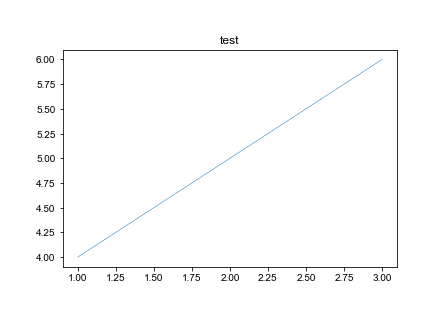

In [164]:
from matplotlib import font_manager
import matplotlib.pyplot as plt

font_path = '/home2/zhenglijing/work/Arial.ttf'
font_manager.fontManager.addfont(font_path)plt.rcParams['font.family'] = 'Arial'
plt.plot([1, 2, 3], [4, 5, 6])
plt.title('test')
plt.show()

In [165]:
csv_path='/home2/zhenglijing/work/annovar/data.csv'  
df_alldata = pd.read_csv(csv_path,encoding="GB2312")  
df_alldata

,检测项目,检测套餐,性别,病历号,年龄,结果数据,结果说明
0,尿肌酐-1073,全套有机酸代谢分析(尿液),女,ASD_B22,5,118.9,正常
1,46. 阿拉伯糖醇,全套有机酸代谢分析(尿液),女,ASD_B22,5,54.67,正常
2,45. 酒石酸,全套有机酸代谢分析(尿液),女,ASD_B22,5,3.06,偏高
3,44. 柠苹酸,全套有机酸代谢分析(尿液),女,ASD_B22,5,3.07,正常
4,43. 丙三羧酸,全套有机酸代谢分析(尿液),女,ASD_B22,5,2.43,偏高
...,...,...,...,...,...,...,...
7918,解连蛋白,肠道功能健康评估（粪便）,男,ASD_076,7,254,偏高
7919,钙卫蛋白,肠道功能健康评估（粪便）,男,ASD_076,7,208,偏高
7920,分泌型免疫球蛋白,肠道功能健康评估（粪便）,男,ASD_076,7,2977,偏高
7921,组织转麸胺酶抗体,肠道功能健康评估（粪便）,男,ASD_076,7,629,偏高


In [167]:
merged_df=pd.read_csv('test_gene_ADOS.csv',encoding="GBK",index_col=0)

In [168]:
merged_df

,病历号,1. 己二酸,10. α-酮戊二酸,11. 琥珀酸,12. 富马酸,13. 苹果酸,14. 羟甲基戊二酸,15. α-酮异戊酸,16. α-酮异己酸,17. α-酮-β-甲基戊酸,...,chr7-72081604-72081604-G-T-TYW1B,chr2-112616040-112616040-T-C-ANAPC1,chr6-58779097-58779097-A-G-NONE,chr1-121484945-121484945-T-C-NONE,type,number_y,Communication,social_interaction,stereotyped_behavior,ASD_total
0,ASD_051,1.87,33.93,6.95,0.37,0.63,10.62,0.47,0.24,0.68,...,nonmutant,nonmutant,nonmutant,nonmutant,ASD,ASD_051,5.0,3.0,0.0,13.0
1,ASD_052,2.77,20.57,7.80,0.41,0.99,9.85,0.45,0.34,0.49,...,nonmutant,nonmutant,nonmutant,nonmutant,ASD,ASD_052,3.0,5.0,0.0,14.0
2,ASD_053,2.38,7.64,7.58,0.22,0.36,9.21,0.32,0.22,0.44,...,nonmutant,nonmutant,mut,nonmutant,ASD,ASD_053,3.0,13.0,4.0,45.0
3,ASD_054,1.35,7.81,5.75,0.39,0.27,6.66,0.32,0.19,0.55,...,nonmutant,mut,nonmutant,nonmutant,ASD,ASD_054,5.0,10.0,1.0,21.0
4,ASD_055,2.57,16.94,12.35,0.47,0.54,10.66,0.35,0.24,0.66,...,nonmutant,mut,nonmutant,nonmutant,ASD,ASD_055,2.0,10.0,0.0,19.0
5,ASD_056,1.42,28.81,3.72,0.59,1.01,6.70,0.44,0.18,0.70,...,nonmutant,mut,nonmutant,nonmutant,ASD,ASD_056,23.0,14.0,5.0,84.0
6,ASD_057,2.17,28.25,4.63,0.57,0.83,10.08,0.44,0.20,0.65,...,nonmutant,mut,nonmutant,nonmutant,ASD,ASD_057,15.0,12.0,1.0,64.0
7,ASD_058,2.23,14.89,7.51,1.17,2.64,6.67,0.56,0.21,0.91,...,nonmutant,mut,nonmutant,nonmutant,ASD,ASD_058,7.0,10.0,2.0,35.0
8,ASD_060,1.89,34.13,15.11,0.99,2.70,6.65,0.65,0.22,0.96,...,nonmutant,mut,nonmutant,nonmutant,ASD,ASD_060,13.0,15.0,5.0,70.0
9,ASD_062,1.63,22.15,5.56,0.33,0.43,6.38,0.27,0.25,0.49,...,nonmutant,nonmutant,mut,nonmutant,ASD,ASD_062,5.0,2.0,0.0,11.0


In [169]:
metabolites =df[1].tolist()

KeyError: 1

In [ ]:
metabolites

In [37]:
plt.rcParams['font.family'] = 'Arial'
ados_columns = ['Communication', 'social_interaction', 'stereotyped_behavior', 'ASD_total']
listr=[]
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(merged_df[metabolite].fillna(0),merged_df[ados_col].fillna(0))
        if p < 0.05:
            listr.append([metabolite,ados_col,p])

NameError: name 'metabolites' is not defined

In [ ]:
listr

In [ ]:
len(listr)

In [ ]:
df

In [39]:
cordf=pd.DataFrame(listr)
cordf

""


In [40]:
df[1]=df[1].map(eng_chi_dict)

KeyError: 1

In [41]:
cordf[0]=cordf[0].map(eng_chi_dict)

KeyError: 0

In [42]:
plotdf=pd.concat([df,cordf]).reset_index()
plotdf=plotdf.drop('index',axis=1)
plotdf

,geneloci,indicator,p_value,gene2_formatted,gene
0,chr16:g.33380263C>G,单丁基酯,0.049701,chr16:g.33380263C>G,ENPP7P13
1,chr16:g.33380263C>G,单丁基酯,0.049701,chr16:g.33380263C>G,LOC390705
2,chr16:g.21771726C>G,单乙基己基酯,0.049701,chr16:g.21771726C>G,OTOA
3,chr2:g.243037022A>T,丁基苯酯,0.049017,chr2:g.243037022A>T,LINC01881
4,chr1:g.145021024G>C,乙酯,0.048546,chr1:g.145021024G>C,LOC100996724
...,...,...,...,...,...
144,chr2:g.112616040T>C,丁酯,0.001236,chr2:g.112616040T>C,ANAPC1
145,chr12:g.55807588C>T,单丁基酯,0.000796,chr12:g.55807588C>T,OR6C65
146,chr12:g.55807588C>T,单丁基酯,0.000796,chr12:g.55807588C>T,OR6C76
147,chr1:g.142799560A>T,单丁基酯,0.000303,chr1:g.142799560A>T,LOC102723769


In [37]:
plotdf.to_csv('cir_zlj0519.csv')

In [38]:
from pycirclize import Circos
from pycirclize.parser import Matrix
import pandas as pd

In [41]:
len(plotdf.iloc[:130][1].unique())

71

In [42]:
plotdf

,0,1,2
0,chr1:g.152284377G>A,AKG,0.049622
1,chr1:g.16890320T>C,Glucarate,0.049524
2,chr1:g.16918734G>C,Calprotectin,0.049018
3,chr14:g.19114642A>G,5-HIAA,0.048924
4,chr14:g.19114642A>G,Picolinate,0.048910
...,...,...,...
254,SOD,Communication,0.008371
255,SOD,ASD_total,0.009653
256,IL-17,Communication,0.000701
257,IL-17,social_interaction,0.016889


### 画图

In [3]:
dfhormone=pd.read_csv('significant_gene_test_mannwhitneyu_p_hormone',index_col=0)
dfhormone['gene']=dfhormone['geneloci'].str.split('-',expand=True)[5]
dfhormone

,geneloci,indicator,p_value,gene2_formatted,gene
0,chr6-58779121-58779121-C-T-NONE,单甲基酯,0.009929,chr6:g.58779121C>T,NONE
1,chr15-21937168-21937168-C-T-LOC646214,单苄基酯,0.009872,chr15:g.21937168C>T,LOC646214
2,chr15-21937168-21937168-C-T-LOC646214,甲酯,0.045335,chr15:g.21937168C>T,LOC646214
3,chr15-21937168-21937168-C-T-LOC646214,丁酯,0.013209,chr15:g.21937168C>T,LOC646214
4,chr15-21937168-21937168-C-T-LOC646214,丁基苯酯,0.004343,chr15:g.21937168C>T,LOC646214
...,...,...,...,...,...
159,chr15-22482721-22482721-T-C-MIR1268A,辛基苯酯,0.023611,chr15:g.22482721T>C,MIR1268A
160,chr14-20147838-20147838-A-G-POTEM,丙酯,0.028879,chr14:g.20147838A>G,POTEM
161,chr7-143964381-143964381-T-C-CTAGE8,双酚A,0.007752,chr7:g.143964381T>C,CTAGE8
162,chr17-36361992-36361992-C-T-NPEPPSP1,壬基苯酯,0.030717,chr17:g.36361992C>T,NPEPPSP1


In [4]:
dfhormone['geneloci'].value_counts()[:65]

geneloci
chr1-144994902-144994902-G-A-LOC100996724      5
chr1-16973519-16973519-G-A-MST1P2              4
chr15-21937168-21937168-C-T-LOC646214          4
chr14-19117129-19117129-A---OR11H12            4
chr14-19117129-19117129-A---NONE               4
                                              ..
chr15-102312009-102312009-G-A-OR4F6            1
chr1-144676632-144676632-T-C-LOC653513         1
chr1-16973606-16973606-G-T-MST1P2              1
chr6-58779121-58779121-C-T-LINC00680-GUSBP4    1
chr7-143964381-143964381-T-C-CTAGE4            1
Name: count, Length: 65, dtype: int64

In [5]:
'MST1P2','FANCD2','TUBA3E','CCDC115','EMBP1','POTEE','TTN','CDK11B','PDPR','CCZ1','CDC14C','POTEM','KIAA1109','MUC4','OR11H2','ABCA13',
'NBPF25P','MAP2K3','CROCCP2','RETSAT','DSE','IQSEC3','NBPF1','CEP120','TRPC3'

('NBPF25P',
 'MAP2K3',
 'CROCCP2',
 'RETSAT',
 'DSE',
 'IQSEC3',
 'NBPF1',
 'CEP120',
 'TRPC3')

In [6]:
dfhormone[dfhormone['indicator']=='双酚A']

,geneloci,indicator,p_value,gene2_formatted,gene
46,chr17-16624049-16624049-T-C-CCDC144A,双酚A,0.016339,chr17:g.16624049T>C,CCDC144A
68,chr6-58779097-58779097-A-G-NONE,双酚A,0.041150,chr6:g.58779097A>G,NONE
93,chr1-148582481-148582481-A-G-NBPF15,双酚A,0.022866,chr1:g.148582481A>G,NBPF15
105,chr5-122737709-122737709-C-T-CEP120,双酚A,0.037701,chr5:g.122737709C>T,CEP120
106,chr6-58779097-58779097-A-G-LINC00680-GUSBP4,双酚A,0.041150,chr6:g.58779097A>G,LINC00680
132,chr7-143964381-143964381-T-C-CTAGE4,双酚A,0.007752,chr7:g.143964381T>C,CTAGE4
161,chr7-143964381-143964381-T-C-CTAGE8,双酚A,0.007752,chr7:g.143964381T>C,CTAGE8


In [7]:
dfsignificant=pd.read_csv('significant_gene_test_mannwhitneyu_p_ne',index_col=0)

def convert_format(original_str):
    parts = original_str.split('-')    chrom = parts[0]  # chr5
    pos = parts[1]    # 34190915
    ref = parts[3]    # C
    alt = parts[4]    # G
    return f"{chrom}:g.{pos}{ref}>{alt}"

dfsignificant['gene2_formatted'] = dfsignificant['geneloci'].apply(convert_format)
dfsignificant['gene']=dfsignificant['geneloci'].str.split('-',expand=True)[5]
dfsignificant

,geneloci,indicator,p_value,gene2_formatted,gene
0,chr16-21548095-21548095-G-A-SLC7A5P2,36. 马尿酸,0.018660,chr16:g.21548095G>A,SLC7A5P2
1,chr16-21548095-21548095-G-A-SLC7A5P2,大豆/毛豆,0.040434,chr16:g.21548095G>A,SLC7A5P2
2,chr16-21548095-21548095-G-A-SLC7A5P2,核桃,0.004010,chr16:g.21548095G>A,SLC7A5P2
3,chr16-33380263-33380263-C-G-ENPP7P13,40. 4-羟基苯乙酸,0.030744,chr16:g.33380263C>G,ENPP7P13
4,chr16-33380263-33380263-C-G-ENPP7P13,丁酯,0.013752,chr16:g.33380263C>G,ENPP7P13
...,...,...,...,...,...
1628,chr2-97712581-97712581-A-C-FAM178B,25. 犬尿喹啉酸,0.025030,chr2:g.97712581A>C,FAM178B
1629,chr2-97712581-97712581-A-C-FAM178B,4. 丙酮酸,0.010303,chr2:g.97712581A>C,FAM178B
1630,chr2-97712581-97712581-A-C-FAM178B,分泌型免疫球蛋白,0.045099,chr2:g.97712581A>C,FAM178B
1631,chr2-97712581-97712581-A-C-FAM178B,葡萄糖醛酸酶,0.002966,chr2:g.97712581A>C,FAM178B


In [8]:
dfsignificant[dfsignificant['indicator'] == 'chr14:g.19807178C>T'] 

,geneloci,indicator,p_value,gene2_formatted,gene


In [9]:
genes=[ 'CDK11B',  'TUBA3E',  'ABCA13', 'LERFS', 'FANCD2',  'MUC20', 'CEP120',
       'ANAPC1',  'OTOA',  'POTEG', 'PDPR', 'CCDC115', 'PDPR', 'CCZ1', 
        'LIMS1', 'MAP2K3','DUSP22', 'OTOA',  'FANCD2', 'ATB','LERFS', 'LERFS', 
       'CCZ1',  'DSE',  'CALHM6', 'MIR1268A']

In [10]:
genes=['MST1P2','FANCD2','TUBA3E','CCDC115','EMBP1','POTEE','TTN','CDK11B','PDPR','CCZ1',
       'CDC14C','POTEM','KIAA1109','MUC4','OR11H2','ABCA13',
'NBPF25P','MAP2K3','CROCCP2','RETSAT','DSE','IQSEC3','NBPF1','CEP120','TRPC3']

In [11]:
plotdf1=dfhormone[dfhormone['gene'].isin(genes)]

In [12]:
plotdf1

,geneloci,indicator,p_value,gene2_formatted,gene
16,chr2-130988410-130988410-G-A-TUBA3E,甲酯,0.045532,chr2:g.130988410G>A,TUBA3E
17,chr2-130988410-130988410-G-A-TUBA3E,乙酯,0.004360,chr2:g.130988410G>A,TUBA3E
18,chr2-130988410-130988410-G-A-TUBA3E,辛基苯酯,0.040441,chr2:g.130988410G>A,TUBA3E
19,chr1-148891790-148891790-T-A-NBPF25P,单丁基酯,0.000689,chr1:g.148891790T>A,NBPF25P
20,chr1-148891790-148891790-T-A-NBPF25P,单苄基酯,0.049463,chr1:g.148891790T>A,NBPF25P
32,chr1-16890320-16890320-T-C-NBPF1,乙酯,0.032467,chr1:g.16890320T>C,NBPF1
35,chr7-48886193-48886193-G-A-ABCA13,单乙基己基酯,0.008208,chr7:g.48886193G>A,ABCA13
36,chr7-48886193-48886193-G-A-ABCA13,辛基苯酯,0.041536,chr7:g.48886193G>A,ABCA13
43,chr3-10106623-10106623-C-T-FANCD2,单苄基酯,0.037475,chr3:g.10106623C>T,FANCD2
44,chr3-10106623-10106623-C-T-FANCD2,甲酯,0.031445,chr3:g.10106623C>T,FANCD2


In [13]:
plotdf2=dfsignificant[(~dfsignificant['indicator'].isin(Hormone+foodallergy+organic_acid))&(dfsignificant['gene'].isin(genes))]

In [14]:
plotdf2['gene'].unique()

array(['MST1P2', 'CDK11B', 'TUBA3E', 'NBPF25P', 'PDPR', 'NBPF1', 'ABCA13',
       'FANCD2', 'EMBP1', 'CCDC115', 'CROCCP2', 'CCZ1', 'MAP2K3',
       'CEP120', 'TRPC3', 'TTN', 'POTEE', 'KIAA1109', 'CDC14C', 'DSE',
       'RETSAT'], dtype=object)

In [84]:
plotdf=pd.concat([plotdf1,plotdf2])[['gene','indicator','p_value']]
plotdf.columns=[0,1,2]
plotdf

,0,1,2
16,TUBA3E,甲酯,0.045532
17,TUBA3E,乙酯,0.004360
18,TUBA3E,辛基苯酯,0.040441
19,NBPF25P,单丁基酯,0.000689
20,NBPF25P,单苄基酯,0.049463
...,...,...,...
1535,MST1P2,丙二醛,0.005779
1537,MST1P2,尿肌酐-1131,0.024355
1538,MST1P2,维生素D2,0.020111
1539,MST1P2,谷胱甘肽,0.024731


In [85]:
'''plotdf=pd.concat([plotdf1,plotdf2])[['gene2_formatted','indicator','p_value']]
plotdf.columns=[0,1,2]
plotdf'''

"plotdf=pd.concat([plotdf1,plotdf2])[['gene2_formatted','indicator','p_value']]\nplotdf.columns=[0,1,2]\nplotdf"

In [86]:
plotdf[plotdf[1]=='双酚A']

,0,1,2
105,CEP120,双酚A,0.037701


In [87]:
plotdf[plotdf[0]=='chr14:g.19807178C>T']

,0,1,2


In [88]:
plotdf=plotdf.reset_index()
plotdf['logP']=-np.log10(plotdf[2])
plotdf.columns=[-1,0,1,2,'logP']
plotdf

,-1,0,1,2,logP
0,16,TUBA3E,甲酯,0.045532,1.341679
1,17,TUBA3E,乙酯,0.004360,2.360471
2,18,TUBA3E,辛基苯酯,0.040441,1.393174
3,19,NBPF25P,单丁基酯,0.000689,3.161877
4,20,NBPF25P,单苄基酯,0.049463,1.305715
...,...,...,...,...,...
141,1535,MST1P2,丙二醛,0.005779,2.238114
142,1537,MST1P2,尿肌酐-1131,0.024355,1.613418
143,1538,MST1P2,维生素D2,0.020111,1.696558
144,1539,MST1P2,谷胱甘肽,0.024731,1.606758


In [89]:
plotdf[[0,1,'logP']].dropna()

,0,1,logP
0,TUBA3E,甲酯,1.341679
1,TUBA3E,乙酯,2.360471
2,TUBA3E,辛基苯酯,1.393174
3,NBPF25P,单丁基酯,3.161877
4,NBPF25P,单苄基酯,1.305715
...,...,...,...
141,MST1P2,丙二醛,2.238114
142,MST1P2,尿肌酐-1131,1.613418
143,MST1P2,维生素D2,1.696558
144,MST1P2,谷胱甘肽,1.606758


In [90]:
leni={}
for i in set(list(plotdf[1])+
            list(plotdf[0])):
    lenth=plotdf[(plotdf[0]==i)]['logP'].sum()+plotdf[(plotdf[1]==i)]['logP'].sum()
    leni[i]=lenth

In [91]:
len(set(gene))

24

In [114]:
gene=[
'ABCA13', 'CCDC115','CCZ1', 'CDC14C', 'CDK11B', 'CEP120', 'CROCCP2',
 'DSE', 'EMBP1','FANCD2', 'IQSEC3', 'KIAA1109', 'MAP2K3', 'MST1P2', 'NBPF1', 'NBPF25P', 'OR11H2', 'PDPR',
 'POTEE', 'POTEM', 'RETSAT', 'TRPC3','TTN', 'TUBA3E',]
 
horm=[ '丁基苯酯','辛基苯酯','丁酯','三氯沙', 
 '丙酯','乙酯','单丁基酯', '单乙基己基酯', '单乙基酯',
 '单甲基酯','单苄基酯','双酚A','壬基苯酯','甲酯',
     ]
 
gut=['解连蛋白','分泌型免疫球蛋白','钙卫蛋白']
    
oxda= ['含硫化合物', '8-羟基脱氧鸟苷', '硝化酪氨酸', '花生四烯酸过氧化物',
 '谷胱甘肽','谷胱甘肽硫转移酶', '超氧化物歧化酶','丙二醛']
    
immune=['干扰素α', '白介素10', '白介素12','白介素17', '白介素1β','白介素2', '白介素4', '白介素5', '白介素6', '白介素8', '干扰素γ',
'肿瘤坏死因子',]
 
VD=['维生素D2']
 

In [115]:
name2color={}
for i in horm:
    name2color[i]=sns.color_palette('tab20')[0]
    
for i in gut:
    name2color[i]=sns.color_palette('tab20')[1]
    
for i in oxda:
    name2color[i]=sns.color_palette('tab20')[2]
    
for i in immune:
    name2color[i]=sns.color_palette('tab20')[3]
    
for i in VD:
    name2color[i]=sns.color_palette('tab20')[4]
    
for i in gene:
    name2color[i]=sns.color_palette('tab20')[5]
    

In [116]:
leni={}
for i in horm+gut+oxda+immune+VD+gene:
    lenth=plotdf[(plotdf[0]==i)]['logP'].sum()+plotdf[(plotdf[1]==i)]['logP'].sum()
    leni[i]=lenth

In [117]:
plotdf

,-1,0,1,2,logP
0,16,TUBA3E,甲酯,0.045532,1.341679
1,17,TUBA3E,乙酯,0.004360,2.360471
2,18,TUBA3E,辛基苯酯,0.040441,1.393174
3,19,NBPF25P,单丁基酯,0.000689,3.161877
4,20,NBPF25P,单苄基酯,0.049463,1.305715
...,...,...,...,...,...
139,1483,DSE,超氧化物歧化酶,0.011846,1.926431
140,1522,PDPR,8-羟基脱氧鸟苷,0.046998,1.327919
141,1535,MST1P2,丙二醛,0.005779,2.238114
143,1538,MST1P2,维生素D2,0.020111,1.696558


In [118]:
plotdf=plotdf[(plotdf[0].isin(horm+gut+oxda+immune+VD+gene))&
       (plotdf[1].isin(horm+gut+oxda+immune+VD+gene))]

In [119]:
plotdf

,-1,0,1,2,logP
0,16,TUBA3E,甲酯,0.045532,1.341679
1,17,TUBA3E,乙酯,0.004360,2.360471
2,18,TUBA3E,辛基苯酯,0.040441,1.393174
3,19,NBPF25P,单丁基酯,0.000689,3.161877
4,20,NBPF25P,单苄基酯,0.049463,1.305715
...,...,...,...,...,...
139,1483,DSE,超氧化物歧化酶,0.011846,1.926431
140,1522,PDPR,8-羟基脱氧鸟苷,0.046998,1.327919
141,1535,MST1P2,丙二醛,0.005779,2.238114
143,1538,MST1P2,维生素D2,0.020111,1.696558


In [120]:
VD

['维生素D2']

In [121]:
leni={}
for i in horm+gut+oxda+immune+VD+gene:
    lenth=plotdf[(plotdf[0]==i)]['logP'].sum()+plotdf[(plotdf[1]==i)]['logP'].sum()
    leni[i]=lenth

In [122]:
plotdf

,-1,0,1,2,logP
0,16,TUBA3E,甲酯,0.045532,1.341679
1,17,TUBA3E,乙酯,0.004360,2.360471
2,18,TUBA3E,辛基苯酯,0.040441,1.393174
3,19,NBPF25P,单丁基酯,0.000689,3.161877
4,20,NBPF25P,单苄基酯,0.049463,1.305715
...,...,...,...,...,...
139,1483,DSE,超氧化物歧化酶,0.011846,1.926431
140,1522,PDPR,8-羟基脱氧鸟苷,0.046998,1.327919
141,1535,MST1P2,丙二醛,0.005779,2.238114
143,1538,MST1P2,维生素D2,0.020111,1.696558


In [123]:
for i in gene:
    eng_chi_dict[i]=i

In [124]:
len(gene)

24

In [125]:
sns.color_palette('tab20',20)

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.6196078431372549, 0.8549019607843137, 0.8980392156862745)]

In [126]:
sns.color_palette('viridis',4)

[(0.253935, 0.265254, 0.529983),
 (0.163625, 0.471133, 0.558148),
 (0.134692, 0.658636, 0.517649),
 (0.477504, 0.821444, 0.318195)]

In [127]:
colorls=sns.color_palette('tab20',20)+["#ED6D46","#108B96",'#4A4B9D','#CD7372'] 

In [128]:
snpcolor={}
for i,s in enumerate(gene):
    snpcolor[s]=colorls[i]

In [129]:
name2color[sector.name]

KeyError: '维生素D'

In [130]:
sector.name

'维生素D'

In [131]:
leni

{'丁基苯酯': 6.641273854382492,
 '辛基苯酯': 13.422701976154308,
 '丁酯': 2.8934957275678057,
 '三氯沙': 8.548977165875296,
 '丙酯': 4.815174150026889,
 '乙酯': 10.425747797684608,
 '单丁基酯': 6.919493942255229,
 '单乙基己基酯': 10.773879236305469,
 '单乙基酯': 3.948784364021273,
 '单甲基酯': 2.9193245609919143,
 '单苄基酯': 2.7319711503158453,
 '双酚A': 1.423641515083691,
 '壬基苯酯': 2.8983670358480396,
 '甲酯': 6.9898222647688435,
 '解连蛋白': 10.446481663450296,
 '分泌型免疫球蛋白': 2.987294097495874,
 '钙卫蛋白': 2.984371683889145,
 '含硫化合物': 3.483846316154804,
 '8-羟基脱氧鸟苷': 2.6490489215137076,
 '硝化酪氨酸': 7.727624506460149,
 '花生四烯酸过氧化物': 1.4046056905827353,
 '谷胱甘肽': 4.434494354510077,
 '谷胱甘肽硫转移酶': 7.458108055160615,
 '超氧化物歧化酶': 6.2084973494771685,
 '丙二醛': 6.196844628929542,
 '干扰素α': 4.740934642014453,
 '白介素10': 10.857556693512107,
 '白介素12': 7.105720199255453,
 '白介素17': 8.014551116249624,
 '白介素1β': 12.169891347640323,
 '白介素2': 3.1999145219594602,
 '白介素4': 10.735575218308666,
 '白介素5': 7.5686883600356385,
 '白介素6': 3.4674000379107506,
 '白介素8': 10.0

In [132]:
plt.rcParams["font.size"] = 12
plt.rcParams["font.family"] = "Arial"
plt.rcParams["pdf.fonttype"] = 42

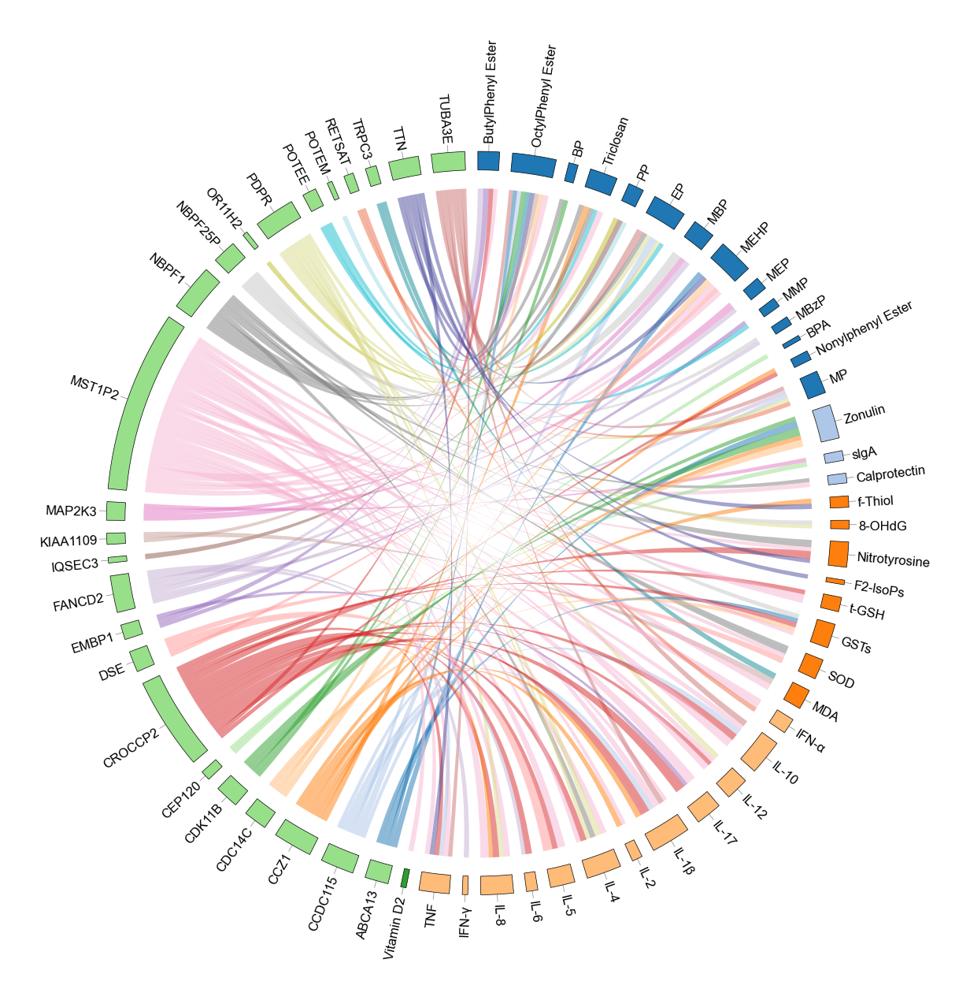

In [133]:
from pycirclize import Circos

sectors = leni
circos = Circos(sectors, space=2)
for sector in circos.sectors:
    track = sector.add_track((95, 100))
    track.axis(fc=name2color[sector.name])
    track.text('', color="black", size=12,)
    track.xticks([])
for sector in circos.sectors:
    track = sector.add_track((90, 100))
    
    label_pos = (sector.start + sector.end) / 2
    
    track.xticks([label_pos], [  eng_chi_dict[sector.name]  ], 
                label_orientation="vertical", 
                label_size=12, 
                line_kws=dict(ec="grey"))
lenplotdict={}
for index in plotdf.index:
    a=plotdf.loc[index,0]
    b=plotdf.loc[index,1]
    if a not in lenplotdict.keys():
        xa=0
        lenth111=plotdf.loc[index,'logP']
        lenplotdict[a]=lenth111
    else:
        xa=lenplotdict[a]
        lenth222=plotdf.loc[index,'logP']
        lenplotdict[a]=lenplotdict[a]+lenth222
    if b not in lenplotdict.keys():
        xb=0
        lenth111=plotdf.loc[index,'logP']
        lenplotdict[b]=lenth111
    else:
        xb=lenplotdict[b]
        lenth222=plotdf.loc[index,'logP']
        lenplotdict[b]=lenplotdict[b]+lenth222
    if a in gene:
        circos.link((a, xa, lenplotdict[a]), (b, xb, lenplotdict[b]) ,color=snpcolor[a])
    else:
        circos.link((a, xa, lenplotdict[a]), (b, xb, lenplotdict[b]))

fig = circos.plotfig(figsize=(12,12))
plt.savefig('Figcircos.pdf', bbox_inches='tight')

In [428]:
snpcolor={}
for i,s in enumerate(horm):
    snpcolor[s]=sns.color_palette('tab20',30)[i]

In [429]:
snpcolor

{'丁基苯酯': (0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 '辛基苯酯': (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 '丁酯': (1.0, 0.4980392156862745, 0.054901960784313725),
 '三氯沙': (1.0, 0.7333333333333333, 0.47058823529411764),
 '丙二醛': (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 '丙酯': (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 '乙酯': (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 '单丁基酯': (1.0, 0.596078431372549, 0.5882352941176471),
 '单乙基己基酯': (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 '单乙基酯': (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 '单甲基酯': (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 '单苄基酯': (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 '双酚A': (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 '壬基苯酯': (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 '甲酯': (0.4980392156862745, 0.4980392156862745, 0.498

In [430]:
plotdf[plotdf[0].str.contains('chr')]

,-1,0,1,2,logP


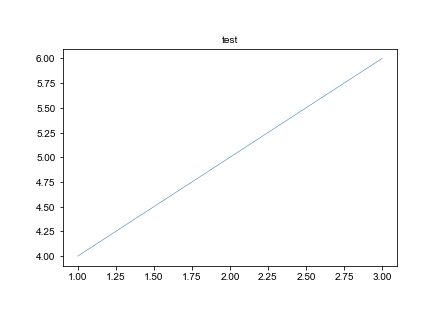

In [431]:
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

font_path = '/home2/zhenglijing/work/Arial.ttf'font = FontProperties(fname=font_path)

plt.plot([1, 2, 3], [4, 5, 6])
plt.title('test', fontproperties=font)
plt.show()


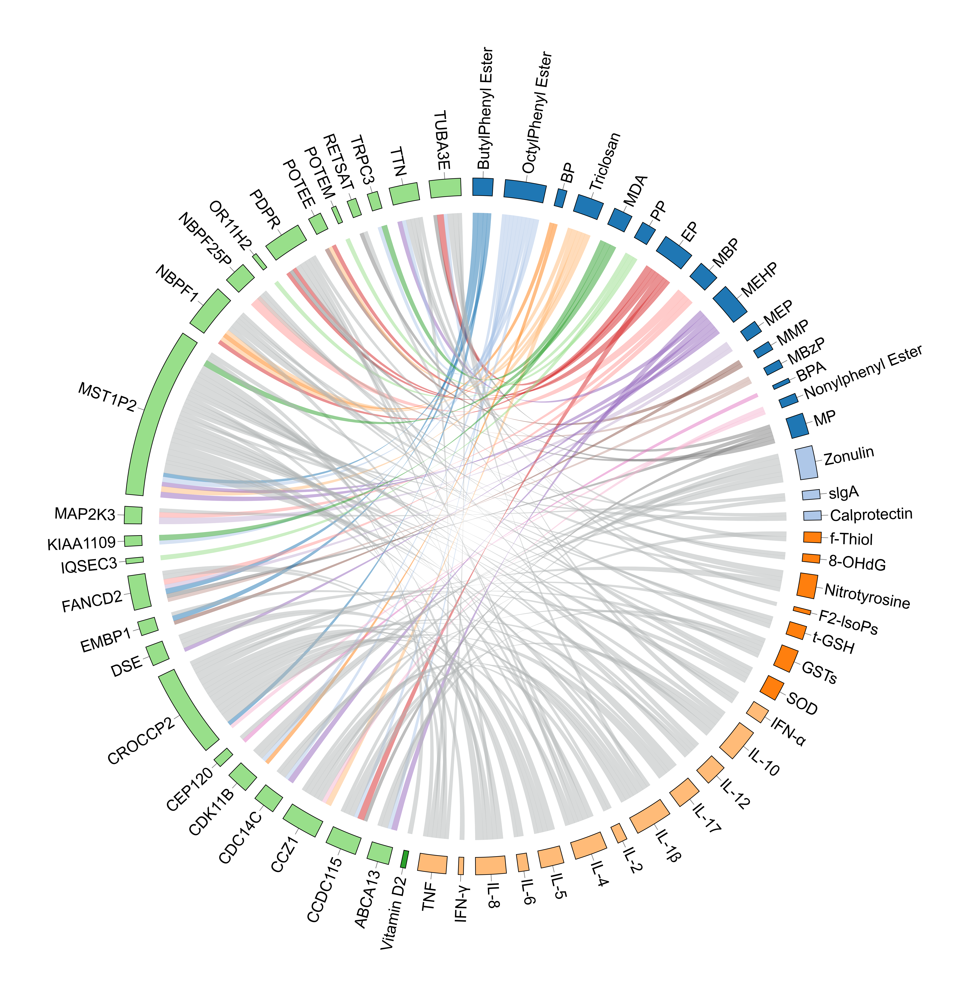

In [432]:
from pycirclize import Circos
plt.rcParams['font.family'] = 'Arial'
sectors = leni
circos = Circos(sectors, space=2)
for sector in circos.sectors:
    track = sector.add_track((95, 100))
    track.axis(fc=name2color[sector.name])
    track.text('', color="black", size=12,)
    track.xticks([])
for sector in circos.sectors:
    track = sector.add_track((90, 100))
    
    label_pos = (sector.start + sector.end) / 2
    
    track.xticks([label_pos], [  eng_chi_dict[sector.name]  ], 
                label_orientation="vertical", 
                label_size=12, 
                line_kws=dict(ec="grey"))
lenplotdict={}
for index in plotdf.index:
    a=plotdf.loc[index,0]
    b=plotdf.loc[index,1]
    if a not in lenplotdict.keys():
        xa=0
        lenth111=plotdf.loc[index,'logP']
        lenplotdict[a]=lenth111
    else:
        xa=lenplotdict[a]
        lenth222=plotdf.loc[index,'logP']
        lenplotdict[a]=lenplotdict[a]+lenth222
    if b not in lenplotdict.keys():
        xb=0
        lenth111=plotdf.loc[index,'logP']
        lenplotdict[b]=lenth111
    else:
        xb=lenplotdict[b]
        lenth222=plotdf.loc[index,'logP']
        lenplotdict[b]=lenplotdict[b]+lenth222
    if b in horm:
        circos.link((a, xa, lenplotdict[a]), (b, xb, lenplotdict[b]) ,color=snpcolor[b])
    else:
        circos.link((a, xa, lenplotdict[a]), (b, xb, lenplotdict[b]),color="#B2B6B6")

fig = circos.plotfig(figsize=(10,10),dpi=550)
plt.savefig('Figcircos.pdf', bbox_inches='tight')

In [433]:
lenplotdict['chr2:g.130988410G>A']
            

KeyError: 'chr2:g.130988410G>A'

In [133]:
lenplotdict

NameError: name 'lenplotdict' is not defined

In [134]:
leni={}
for i in horm+snp+food+immune+oxda+acid+gut:
    lenth=plotdf.iloc[:130][(plotdf.iloc[:130][0]==i)]['logP'].sum()+plotdf.iloc[:130][(plotdf.iloc[:130][1]==i)]['logP'].sum()
    leni[i]=lenth

NameError: name 'snp' is not defined

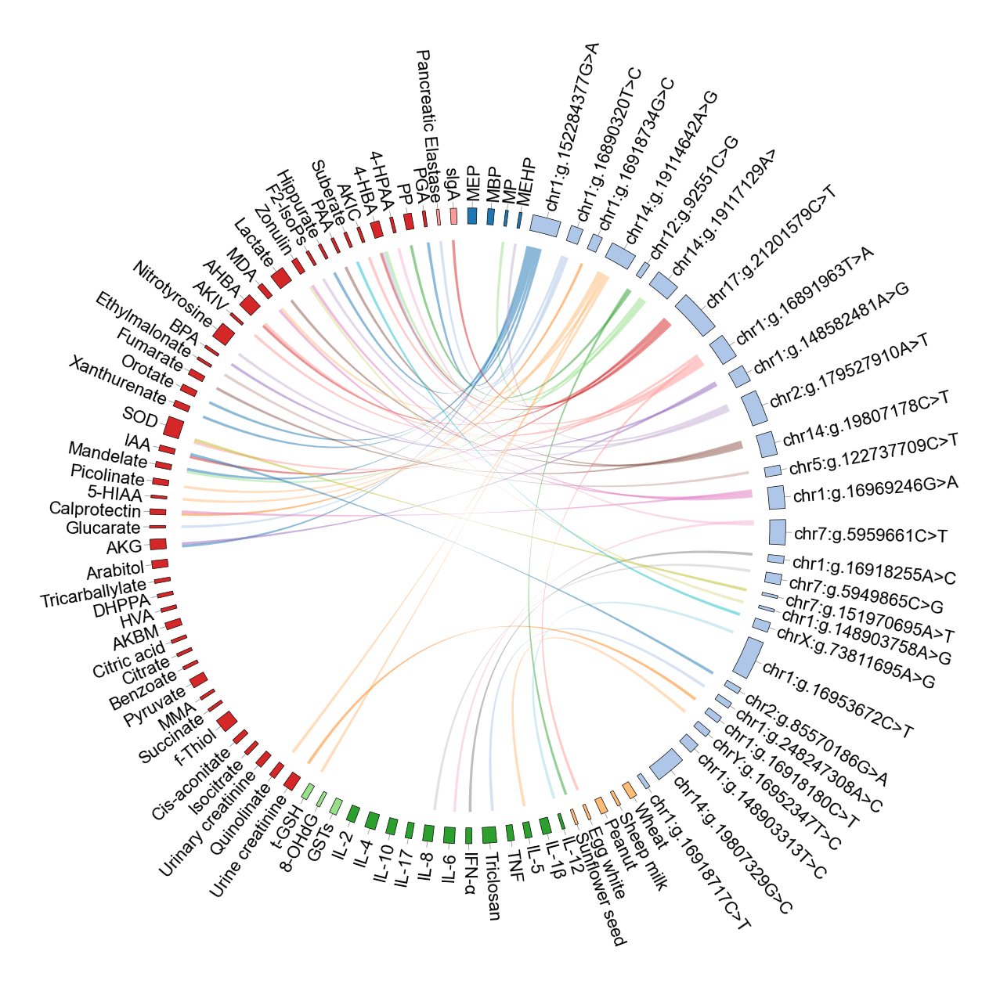

In [57]:
from pycirclize import Circos

sectors = leni
circos = Circos(sectors, space=2)
for sector in circos.sectors:
    track = sector.add_track((95, 100))
    track.axis(fc=name2color[sector.name])
    track.text('', color="black", size=12,)
    track.xticks([])
for sector in circos.sectors:
    track = sector.add_track((90, 100))
    
    label_pos = (sector.start + sector.end) / 2
    
    track.xticks([label_pos], [sector.name], 
                label_orientation="vertical", 
                label_size=16, 
                line_kws=dict(ec="grey"))
lenplotdict={}
for index in plotdf.iloc[:53].index:
    a=plotdf.loc[index,0]
    b=plotdf.loc[index,1]
    if a not in lenplotdict.keys():
        xa=0
        lenth111=plotdf.loc[index,'logP']
        lenplotdict[a]=lenth111
    else:
        xa=lenplotdict[a]
        lenth222=plotdf.loc[index,'logP']
        lenplotdict[a]=lenplotdict[a]+lenth222
    if b not in lenplotdict.keys():
        xb=0
        lenth111=plotdf.loc[index,'logP']
        lenplotdict[b]=lenth111
    else:
        xb=lenplotdict[b]
        lenth222=plotdf.loc[index,'logP']
        lenplotdict[b]=lenplotdict[b]+lenth222
    if a in snp:
        circos.link((a, xa, lenplotdict[a]), (b, xb, lenplotdict[b]) ,color=snpcolor[a])
    else:
        circos.link((a, xa, lenplotdict[a]), (b, xb, lenplotdict[b]))

fig = circos.plotfig(figsize=(12,12))

In [252]:
!pip install plotly

In [253]:
!python --version

Python 3.10.9


In [ ]:
!pip install plotly

In [259]:
import sys
print(sys.executable)

/home2/zhenglijing/program/ENTER/envs/py38/bin/python


In [29]:
import plotly
print(plotly.__version__)

5.18.0


### 1

In [118]:
import plotly.io as pio
pio.renderers.default = 'notebook'

In [119]:
import plotly.graph_objects as go
import pandas as pd
data_table = [
    ['Gene A', 'Metric X', 10],
    ['Gene A', 'Metric Y', 5],
    ['Gene B', 'Metric X', 8],
    ['Gene B', 'Metric Z', 12],
    ['Gene C', 'Metric Y', 7],
    ['Gene C', 'Metric Z', 9],
    ['Gene A', 'Metric Z', 3]]

df = pd.DataFrame(data_table, columns=['Source_Gene', 'Target_Metric', 'Value'])

genes = df['Source_Gene'].unique().tolist()
metrics = df['Target_Metric'].unique().tolist()

labels = genes + metrics

label_to_index = {label: i for i, label in enumerate(labels)}

source_indices = []
target_indices = []
link_values = []

for index, row in df.iterrows():
    source_name = row['Source_Gene']
    target_name = row['Target_Metric']
    value = row['Value']

    source_idx = label_to_index[source_name]
    target_idx = label_to_index[target_name]

    source_indices.append(source_idx)
    target_indices.append(target_idx)
    link_values.append(value)

fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,        thickness=20,        line=dict(color="black", width=0.5),        label=labels,    ),
    link=dict(
        source=source_indices,        target=target_indices,        value=link_values,    ),
    textfont=dict(
        size=20,    )
)])
fig.update_layout(title_text="基因与指标互动关系示例桑葚图 (来自Python表格)",
                  font_size=10)

fig.show()

In [120]:
df4=pd.read_csv('ADOS_gene.csv',index_col=0)
df4

,geneloci,indicator,p_value
0,chr15-20433733-20433733-A-C-CHEK2P2,stereotyped_behavior,0.028033
1,chr2-95515221-95515221-C-T-ANKRD20A8P,Communication,0.019797
2,chr2-95515221-95515221-C-T-ANKRD20A8P,stereotyped_behavior,0.018012
3,chr2-95515221-95515221-C-T-ANKRD20A8P,ASD_total,0.029565
4,chr12-64216816-64216816-A-C-MIR10527,Communication,0.032081
5,chr12-64216816-64216816-A-C-MIR10527,social_interaction,0.008761
6,chr12-64216816-64216816-A-C-MIR10527,stereotyped_behavior,0.012585
7,chr12-64216816-64216816-A-C-MIR10527,ASD_total,0.016842
8,chr1-16969246-16969246-G-A-MST1P2,Communication,0.041526
9,chr1-17014940-17014940-C-T-ESPNP,Communication,0.045729


In [121]:
def format_gene2(row):
    parts = row.split('-')    chrom = parts[0]    pos = parts[1]    ref = parts[3]    alt = parts[4]    return f"{chrom}:g.{pos}{ref}>{alt}"
df4['gene2_formatted'] = df4['geneloci'].apply(format_gene2)

df4

,geneloci,indicator,p_value,gene2_formatted
0,chr15-20433733-20433733-A-C-CHEK2P2,stereotyped_behavior,0.028033,chr15:g.20433733A>C
1,chr2-95515221-95515221-C-T-ANKRD20A8P,Communication,0.019797,chr2:g.95515221C>T
2,chr2-95515221-95515221-C-T-ANKRD20A8P,stereotyped_behavior,0.018012,chr2:g.95515221C>T
3,chr2-95515221-95515221-C-T-ANKRD20A8P,ASD_total,0.029565,chr2:g.95515221C>T
4,chr12-64216816-64216816-A-C-MIR10527,Communication,0.032081,chr12:g.64216816A>C
5,chr12-64216816-64216816-A-C-MIR10527,social_interaction,0.008761,chr12:g.64216816A>C
6,chr12-64216816-64216816-A-C-MIR10527,stereotyped_behavior,0.012585,chr12:g.64216816A>C
7,chr12-64216816-64216816-A-C-MIR10527,ASD_total,0.016842,chr12:g.64216816A>C
8,chr1-16969246-16969246-G-A-MST1P2,Communication,0.041526,chr1:g.16969246G>A
9,chr1-17014940-17014940-C-T-ESPNP,Communication,0.045729,chr1:g.17014940C>T


In [122]:
df4

,geneloci,indicator,p_value,gene2_formatted
0,chr15-20433733-20433733-A-C-CHEK2P2,stereotyped_behavior,0.028033,chr15:g.20433733A>C
1,chr2-95515221-95515221-C-T-ANKRD20A8P,Communication,0.019797,chr2:g.95515221C>T
2,chr2-95515221-95515221-C-T-ANKRD20A8P,stereotyped_behavior,0.018012,chr2:g.95515221C>T
3,chr2-95515221-95515221-C-T-ANKRD20A8P,ASD_total,0.029565,chr2:g.95515221C>T
4,chr12-64216816-64216816-A-C-MIR10527,Communication,0.032081,chr12:g.64216816A>C
5,chr12-64216816-64216816-A-C-MIR10527,social_interaction,0.008761,chr12:g.64216816A>C
6,chr12-64216816-64216816-A-C-MIR10527,stereotyped_behavior,0.012585,chr12:g.64216816A>C
7,chr12-64216816-64216816-A-C-MIR10527,ASD_total,0.016842,chr12:g.64216816A>C
8,chr1-16969246-16969246-G-A-MST1P2,Communication,0.041526,chr1:g.16969246G>A
9,chr1-17014940-17014940-C-T-ESPNP,Communication,0.045729,chr1:g.17014940C>T


In [123]:
df4['logP']=-np.log10(df4['p_value'])
df4[['geneloci','indicator','logP']]
df4.columns=['geneloci', 'Target_Metric',2,'Source_Gene', 'Value']

In [124]:
df4

,geneloci,Target_Metric,2,Source_Gene,Value
0,chr15-20433733-20433733-A-C-CHEK2P2,stereotyped_behavior,0.028033,chr15:g.20433733A>C,1.552330
1,chr2-95515221-95515221-C-T-ANKRD20A8P,Communication,0.019797,chr2:g.95515221C>T,1.703409
2,chr2-95515221-95515221-C-T-ANKRD20A8P,stereotyped_behavior,0.018012,chr2:g.95515221C>T,1.744446
3,chr2-95515221-95515221-C-T-ANKRD20A8P,ASD_total,0.029565,chr2:g.95515221C>T,1.529225
4,chr12-64216816-64216816-A-C-MIR10527,Communication,0.032081,chr12:g.64216816A>C,1.493757
5,chr12-64216816-64216816-A-C-MIR10527,social_interaction,0.008761,chr12:g.64216816A>C,2.057459
6,chr12-64216816-64216816-A-C-MIR10527,stereotyped_behavior,0.012585,chr12:g.64216816A>C,1.900146
7,chr12-64216816-64216816-A-C-MIR10527,ASD_total,0.016842,chr12:g.64216816A>C,1.773597
8,chr1-16969246-16969246-G-A-MST1P2,Communication,0.041526,chr1:g.16969246G>A,1.381677
9,chr1-17014940-17014940-C-T-ESPNP,Communication,0.045729,chr1:g.17014940C>T,1.339810


In [125]:
df4.drop(17)

,geneloci,Target_Metric,2,Source_Gene,Value
0,chr15-20433733-20433733-A-C-CHEK2P2,stereotyped_behavior,0.028033,chr15:g.20433733A>C,1.552330
1,chr2-95515221-95515221-C-T-ANKRD20A8P,Communication,0.019797,chr2:g.95515221C>T,1.703409
2,chr2-95515221-95515221-C-T-ANKRD20A8P,stereotyped_behavior,0.018012,chr2:g.95515221C>T,1.744446
3,chr2-95515221-95515221-C-T-ANKRD20A8P,ASD_total,0.029565,chr2:g.95515221C>T,1.529225
4,chr12-64216816-64216816-A-C-MIR10527,Communication,0.032081,chr12:g.64216816A>C,1.493757
5,chr12-64216816-64216816-A-C-MIR10527,social_interaction,0.008761,chr12:g.64216816A>C,2.057459
6,chr12-64216816-64216816-A-C-MIR10527,stereotyped_behavior,0.012585,chr12:g.64216816A>C,1.900146
7,chr12-64216816-64216816-A-C-MIR10527,ASD_total,0.016842,chr12:g.64216816A>C,1.773597
8,chr1-16969246-16969246-G-A-MST1P2,Communication,0.041526,chr1:g.16969246G>A,1.381677
9,chr1-17014940-17014940-C-T-ESPNP,Communication,0.045729,chr1:g.17014940C>T,1.339810


In [126]:
df4['Target_Metric'] = df4['Target_Metric'].replace('stereotyped_behavior', 'RRB')
df4['Target_Metric'] = df4['Target_Metric'].replace('Communication', 'SCI')
df4['Target_Metric'] = df4['Target_Metric'].replace('social_interaction', 'SRS')
df4['Target_Metric'] = df4['Target_Metric'].replace('ASD_total', 'ADOS total')

In [128]:
plt.rcParams["font.size"] = 12
plt.rcParams["font.family"] = "Arial"
plt.rcParams["pdf.fonttype"] = 42

In [129]:
labels

['Gene A', 'Gene B', 'Gene C', 'Metric X', 'Metric Y', 'Metric Z']

In [130]:
import plotly.graph_objects as go
import pandas as pd


plt.rcParams['font.family'] = 'Arial'
genes = df4['Source_Gene'].unique().tolist()
metrics = df4['Target_Metric'].unique().tolist()

labels = genes + metrics

node_colors = ["#c05982"] * len(genes) + ['#dd6b7b','#f5b087','#e4b8d5','#8ab8ff',]


label_to_index = {label: i for i, label in enumerate(labels)}

source_indices = []
target_indices = []
link_values = []
link_colors = []
for index, row in df4.iterrows():
    source_name = row['Source_Gene']
    target_name = row['Target_Metric']
    value = row['Value']

    source_idx = label_to_index[source_name]
    target_idx = label_to_index[target_name]

    source_indices.append(source_idx)
    target_indices.append(target_idx)
    link_values.append(value)

    link_color = node_colors[target_idx]
    link_colors.append(link_color)


fig = go.Figure(data=[go.Sankey(
    
    node=dict(
        pad=15,        thickness=20,        line=dict(color="black", width=0.5),        label=labels,        color=node_colors,
    ),
    link=dict(
        source=source_indices,        target=target_indices,        value=link_values,        color=link_colors    ),
    textfont=dict(
        size=16 ,        color="black"    )


)])

fig.update_layout(title_text="基因与指标互动关系示例桑葚图 (链接按目标节点上色)",
                  font_size=10,
                  width=1000,                  height=700                 )
fig.write_image("gene_relation_sankey.pdf", format="pdf")
fig.show()

In [131]:
def hex_to_rgba(hex_color, alpha=1.0):
    """
    将十六进制颜色代码转换为 RGBA 格式
    :param hex_color: 十六进制颜色代码，如 "#c05982"
    :param alpha: 透明度，取值范围为 0.0 到 1.0
    :return: 包含 RGBA 值的字符串，如 "rgba(192, 89, 130, 0.5)"
    """
    hex_color = hex_color.lstrip('#')
    r = int(hex_color[0:2], 16)
    g = int(hex_color[2:4], 16)
    b = int(hex_color[4:6], 16)
    return f"rgba({r}, {g}, {b}, {alpha})"


node_colors_hex = ["#c05982"] * len(genes) + ['#dd6b7b', '#f5b087', '#e4b8d5', '#8ab8ff']
alpha = 0.7
node_colors_rgba = [hex_to_rgba(color, alpha) for color in node_colors_hex]

print(node_colors_rgba)

['rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(192, 89, 130, 0.7)', 'rgba(221, 107, 123, 0.7)', 'rgba(245, 176, 135, 0.7)', 'rgba(228, 184, 213, 0.7)', 'rgba(138, 184, 255, 0.7)']


In [132]:
df4

,geneloci,Target_Metric,2,Source_Gene,Value
0,chr15-20433733-20433733-A-C-CHEK2P2,RRB,0.028033,chr15:g.20433733A>C,1.552330
1,chr2-95515221-95515221-C-T-ANKRD20A8P,SCI,0.019797,chr2:g.95515221C>T,1.703409
2,chr2-95515221-95515221-C-T-ANKRD20A8P,RRB,0.018012,chr2:g.95515221C>T,1.744446
3,chr2-95515221-95515221-C-T-ANKRD20A8P,ADOS total,0.029565,chr2:g.95515221C>T,1.529225
4,chr12-64216816-64216816-A-C-MIR10527,SCI,0.032081,chr12:g.64216816A>C,1.493757
5,chr12-64216816-64216816-A-C-MIR10527,SRS,0.008761,chr12:g.64216816A>C,2.057459
6,chr12-64216816-64216816-A-C-MIR10527,RRB,0.012585,chr12:g.64216816A>C,1.900146
7,chr12-64216816-64216816-A-C-MIR10527,ADOS total,0.016842,chr12:g.64216816A>C,1.773597
8,chr1-16969246-16969246-G-A-MST1P2,SCI,0.041526,chr1:g.16969246G>A,1.381677
9,chr1-17014940-17014940-C-T-ESPNP,SCI,0.045729,chr1:g.17014940C>T,1.339810


In [133]:
import plotly.graph_objects as go
import pandas as pd


plt.rcParams['font.family'] = 'Arial'
genes = df4['Source_Gene'].unique().tolist()
metrics = df4['Target_Metric'].unique().tolist()

labels = genes + metrics

node_colors = node_colors_rgba


label_to_index = {label: i for i, label in enumerate(labels)}

source_indices = []
target_indices = []
link_values = []
link_colors = []
for index, row in df4.iterrows():
    source_name = row['Source_Gene']
    target_name = row['Target_Metric']
    value = row['Value']

    source_idx = label_to_index[source_name]
    target_idx = label_to_index[target_name]

    source_indices.append(source_idx)
    target_indices.append(target_idx)
    link_values.append(value)

    link_color = node_colors[target_idx]
    link_colors.append(link_color)


fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,        thickness=20,        line=dict(color="black", width=0.5),        label=labels,        color=node_colors,
    ),
    link=dict(
        source=source_indices,        target=target_indices,        value=link_values,        color=link_colors    ),
    textfont=dict(
        size=16 ,        color="black"    )


)])

fig.update_layout(title_text="基因与指标互动关系示例桑葚图 (链接按目标节点上色)",
                  font_size=10,
                  width=1000,                  height=700                 )
fig.write_image("gene_relation_sankey.pdf", format="pdf")
fig.show()

In [62]:
target_indices

[19,
 20,
 19,
 21,
 20,
 22,
 19,
 21,
 20,
 20,
 22,
 21,
 20,
 22,
 19,
 21,
 19,
 19,
 20,
 20,
 20,
 20,
 22,
 19,
 21,
 20,
 21,
 20,
 20,
 19,
 22,
 19,
 19,
 19,
 20,
 19,
 20,
 20,
 21]

In [63]:
1

1

In [135]:
newls=[]
for index in subdf1.index:
    ls=[list(subdf1.loc[index,[0,1]])]*int(subdf1.loc[index,'R'])
    newls.extend(ls)

NameError: name 'subdf1' is not defined

In [ ]:
df4.columns=['BMhub','PBhub',1,0]

In [134]:
import plotly.graph_objects as go
import pandas as pd

df = df4

unique_sch = df['BMhub'].unique()
unique_motif = df['PBhub'].unique()

sch_indices = {sch: i for i, sch in enumerate(unique_sch)}
motif_indices = {motif: i + len(unique_sch) for i, motif in enumerate(unique_motif)}

source = []
target = []
value = []
colors=[]
for index, row in df.iterrows():
    source.append(sch_indices[row['BMhub']])
    target.append(motif_indices[row['PBhub']])
    value.append(row[0])
    colors.append(selcolordict[row["PBhub"]]) 
fig = go.Figure(go.Sankey(
    node=dict(
        pad=5,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=list(unique_sch) + list(unique_motif),
        color=["blue"] * len(unique_sch) + ["green"] * len(unique_motif)
    ),
    link=dict(
        source=source,
        target=target,
        value=value
    )
))

fig.update_layout(title_text="Sankey Diagram of SCH and motiftype", font_size=10)
fig.show()


KeyError: 'BMhub'

In [65]:
color_map = {sch: 'blue' for sch in unique_sch} 

NameError: name 'unique_sch' is not defined

In [ ]:
unique_motif

In [66]:
ASD=[ 'ASD_total', 'Communication', 'social_interaction','stereotyped_behavior',]

food=[ 'Squid','Cabbage','Corn', 'Bamboo shoots','Wheat', 'Salmon',]

immune=[ 'IFN-α', 'TNF','IL-5','IL-10',]

oxda=[  't-GSH', 'GSTs',"8-OHdG",]

horm=[ 'MEP','MBP', 'MBzP', 'MMP',]

acid=[ 'HMG', 'VMA', 'Adipate','Ethylmalonate', 
 'Tricarballylate', 'Xanthurenate', 'IAA','HVA', 
 'Orotate', 'Kynurenate', 
 'AKG', 'PAA','Fumarate','Lactate','Pyruvate']

gut=['slgA','Anti-Gliadin slgA','Anti-htTG slgA','Pancreatic Elastase',]

snp=list(plotdf.iloc[:53][0].unique())

NameError: name 'plotdf' is not defined

In [67]:
sells=horm+immune+oxda+gut+food+acid

In [68]:
sells

['MEP',
 'MBP',
 'MBzP',
 'MMP',
 'IFN-α',
 'TNF',
 'IL-5',
 'IL-10',
 't-GSH',
 'GSTs',
 '8-OHdG',
 'slgA',
 'Anti-Gliadin slgA',
 'Anti-htTG slgA',
 'Pancreatic Elastase',
 'Squid',
 'Cabbage',
 'Corn',
 'Bamboo shoots',
 'Wheat',
 'Salmon',
 'HMG',
 'VMA',
 'Adipate',
 'Ethylmalonate',
 'Tricarballylate',
 'Xanthurenate',
 'IAA',
 'HVA',
 'Orotate',
 'Kynurenate',
 'AKG',
 'PAA',
 'Fumarate',
 'Lactate',
 'Pyruvate']

In [69]:
selcolor=['black','black','black','black',
          'red','red','red','red',
          'blue','blue','blue',
          'purple','purple','purple','purple',
          'green','green','green','green','green','green',
          'grey','grey','grey','grey','grey','grey','grey',
          'grey','grey','grey','grey','grey','grey','grey','grey',
         ]

In [70]:
selcolordict=dict(zip(sells,selcolor))

In [71]:
selcolordict

{'MEP': 'black',
 'MBP': 'black',
 'MBzP': 'black',
 'MMP': 'black',
 'IFN-α': 'red',
 'TNF': 'red',
 'IL-5': 'red',
 'IL-10': 'red',
 't-GSH': 'blue',
 'GSTs': 'blue',
 '8-OHdG': 'blue',
 'slgA': 'purple',
 'Anti-Gliadin slgA': 'purple',
 'Anti-htTG slgA': 'purple',
 'Pancreatic Elastase': 'purple',
 'Squid': 'green',
 'Cabbage': 'green',
 'Corn': 'green',
 'Bamboo shoots': 'green',
 'Wheat': 'green',
 'Salmon': 'green',
 'HMG': 'grey',
 'VMA': 'grey',
 'Adipate': 'grey',
 'Ethylmalonate': 'grey',
 'Tricarballylate': 'grey',
 'Xanthurenate': 'grey',
 'IAA': 'grey',
 'HVA': 'grey',
 'Orotate': 'grey',
 'Kynurenate': 'grey',
 'AKG': 'grey',
 'PAA': 'grey',
 'Fumarate': 'grey',
 'Lactate': 'grey',
 'Pyruvate': 'grey'}

In [72]:
import plotly.io as pio
pio.renderers.default = 'notebook'

In [73]:
motif_indices

NameError: name 'motif_indices' is not defined

In [ ]:
target

In [80]:
import plotly.graph_objects as go
import pandas as pd

df = pd.DataFrame(newls, columns=['BMhub', 'PBhub'])
df_agg = df.groupby(["BMhub", "PBhub"]).size().reset_index(name='value')


df = df_agg
unique_sch = df['BMhub'].unique()
unique_motif = df['PBhub'].unique()


desired_order = sellsdesired_order = [motif for motif in desired_order if motif in unique_motif]
sch_indices = {sch: i for i, sch in enumerate(unique_sch)}
motif_indices = {motif: i + len(unique_sch) for i, motif in enumerate(desired_order)}

source = []
target = []
value = []
color = []colors = []
color_map = dict(zip(unique_sch,sns.color_palette('tab20',20)))
for index, row in df.iterrows():
    src_index = sch_indices[row['BMhub']]
    tgt_index = motif_indices.get(row['PBhub'], None)    if tgt_index is not None:        source.append(src_index)
        target.append(tgt_index)
        value.append(row['value'])
    
    colors.append(selcolordict[row["PBhub"]]) 
fig = go.Figure(go.Sankey(
    node=dict(
        pad=20,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=list(unique_sch) + list(desired_order),
        color=["blue"] * len(unique_sch) + [selcolordict[i] for i in desired_order]    ),
    link=dict(
        source=source,
        target=target,
        value=value,
        color=colors    )
))
fig.update_layout(
    title_text="Sankey Diagram of SCH and motiftype",
    font_size=10,
    width=800,    height=1000)

fig.show()

In [74]:
motif_indices

NameError: name 'motif_indices' is not defined

In [ ]:
len(desired_order)

In [75]:
subdf2=plotdf.iloc[53:]
subdf2['R']=round(subdf2['logP'],2)*100
subdf2

NameError: name 'plotdf' is not defined

In [76]:
newls2=[]
for index in subdf2[subdf2[0]!='Urinary creatinine'].index:
    ls=[list(subdf2.loc[index,[0,1]])]*int(subdf2.loc[index,'R'])
    newls2.extend(ls)

NameError: name 'subdf2' is not defined

In [ ]:
import plotly.graph_objects as go
import pandas as pd

df = pd.DataFrame(newls2, columns=[ 'PBhub','BMhub',])
df_agg = df.groupby(["BMhub", "PBhub"]).size().reset_index(name='value')


df = df_agg
unique_sch = df['BMhub'].unique()
unique_motif = df['PBhub'].unique()


desired_order = sellsdesired_order = [motif for motif in desired_order if motif in unique_motif]
sch_indices = {sch: i for i, sch in enumerate(unique_sch)}
motif_indices = {motif: i + len(unique_sch) for i, motif in enumerate(desired_order)}

source = []
target = []
value = []
color = []colors = []
color_map = dict(zip(unique_sch,sns.color_palette('tab20',20)))
for index, row in df.iterrows():
    src_index = sch_indices[row['BMhub']]
    tgt_index = motif_indices.get(row['PBhub'], None)    if tgt_index is not None:        source.append(src_index)
        target.append(tgt_index)
        value.append(row['value'])
    
    colors.append(selcolordict[row["PBhub"]]) 
fig = go.Figure(go.Sankey(
    node=dict(
        pad=20,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=list(unique_sch) + list(desired_order),
        color=["blue"] * len(unique_sch) + [selcolordict[i] for i in desired_order]    ),
    link=dict(
        source=source,
        target=target,
        value=value,
        color=colors    )
))
fig.update_layout(
    title_text="Sankey Diagram of SCH and motiftype",
    font_size=10,
    width=800,    height=1000)

fig.show()

In [ ]:
len(unique_sch)

In [ ]:
color_map

In [287]:
desired_order

['Monoethyl ester',
 'Monomethyl ester',
 'Monobenzyl ester',
 'Monobutyl ester',
 'TNF',
 'IFN-α',
 'IL-10',
 'IL-5',
 'Glutathione (GSH)',
 'Glutathione S-transferase (GST)',
 "8-hydroxy-2'-deoxyguanosine (8-OHdG)",
 'Anti-tissue transglutaminase antibodies',
 'Elastase',
 'Secretory immunoglobulin',
 'Anti-gliadin antibodies',
 'Bamboo shoots',
 'Cabbage',
 'Corn',
 'Salmon',
 'Wheat',
 'Squid',
 'Kynurenic acid',
 'Fumaric acid',
 'Lactic acid',
 'Phenylacetic acid',
 'Pyruvic acid',
 'α-Ketoglutaric acid',
 'Indole-3-acetic acid',
 'Ethylmalonic acid',
 'Uric acid',
 'Hexanedioic acid',
 'Hydroxymethyl glutaric acid',
 'Tricarboxylic acid',
 'Vanilloylmandelic acid',
 'Vanillic acid']

In [288]:
sells

['Monoethyl ester',
 'Monomethyl ester',
 'Monobenzyl ester',
 'Monobutyl ester',
 'TNF',
 'IFN-α',
 'IL-10',
 'IL-5',
 'Glutathione (GSH)',
 'Glutathione S-transferase (GST)',
 "8-hydroxy-2'-deoxyguanosine (8-OHdG)",
 'Anti-tissue transglutaminase antibodies',
 'Elastase',
 'Secretory immunoglobulin',
 'Anti-gliadin antibodies',
 'Bamboo shoots',
 'Cabbage',
 'Corn',
 'Salmon',
 'Wheat',
 'Squid',
 'Kynurenic acid',
 'Fumaric acid',
 'Lactic acid',
 'Phenylacetic acid',
 'Pyruvic acid',
 'α-Ketoglutaric acid',
 'Indole-3-acetic acid',
 'Ethylmalonic acid',
 'Uric acid',
 'Hexanedioic acid',
 'Hydroxymethyl glutaric acid',
 'Tricarboxylic acid',
 'Vanilloylmandelic acid',
 'Vanillic acid']

In [289]:
df['BMhub'].unique()

array(['2-Methylhippuric acid', 'Anti-tissue transglutaminase antibodies',
       'Butyl ester', 'Citric acid', 'Glucaric acid', 'Glutathione (GSH)',
       'Grape', 'Honey', 'IFN-α', 'IL-10', 'IL-12', 'IL-1β', 'IL-4',
       'Lactic acid', 'Monobenzyl ester', 'Monobutyl ester',
       'Monooctyl ester', 'Phenylacetic acid', 'Salmon',
       'Superoxide dismutase (SOD)', 'Vanilloylmandelic acid', 'Wheat'],
      dtype=object)

In [290]:
import plotly.graph_objects as go
import pandas as pd

df = pd.DataFrame(newls2, columns=['BMhub', 'PBhub'])
df_agg = df.groupby(["BMhub", "PBhub"]).size().reset_index()

df = df_agg

ideal_order = sells
unique_sch = [i for i in df['BMhub'].unique() if i in sells]
unique_motif = df['PBhub'].unique()

sch_indices = {sch: i for i, sch in enumerate(unique_sch)}
motif_indices = {motif: i + len(unique_sch) for i, motif in enumerate(unique_motif)}

source = []
target = []
value = []

for index, row in df.iterrows():
    if row['BMhub'] in sch_indices and row['PBhub'] in motif_indices:
        source.append(sch_indices[row['BMhub']])
        target.append(motif_indices[row['PBhub']])
        value.append(row[0])

fig = go.Figure(go.Sankey(
    node=dict(
        pad=5,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=list(unique_sch) + list(unique_motif),
        color=["blue"] * len(unique_sch) + ["green"] * len(unique_motif)
    ),
    link=dict(
        source=source,
        target=target,
        value=value
    )
))
fig.update_layout(title_text="Sankey Diagram of SCH and motiftype", font_size=10)
fig.show()